# **California Housing**

Name: Shriya H Haral



**Linear Regression For California Housing Dataset**




In [ ]:
!pip install tensorflow tensorflow-data-validation

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 42.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.9/99.9 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.5/22.5 MB 48.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.0/152.0 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 82.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error , mean_absolute_percentage_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv("housing.csv")

In [ ]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [ ]:
df.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [ ]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [ ]:
df.shape

(20640, 10)

In [ ]:
# Dataset Columns
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [ ]:
# Check Unique Values for each variable.
for i in df.columns:
  print("No. of unique values in ",i,"is", df[i].nunique())

No. of unique values in  longitude is 844
No. of unique values in  latitude is 862
No. of unique values in  housing_median_age is 52
No. of unique values in  total_rooms is 5926
No. of unique values in  total_bedrooms is 1923
No. of unique values in  population is 3888
No. of unique values in  households is 1815
No. of unique values in  median_income is 12928
No. of unique values in  median_house_value is 3842
No. of unique values in  ocean_proximity is 5


<function matplotlib.pyplot.show(close=None, block=None)>

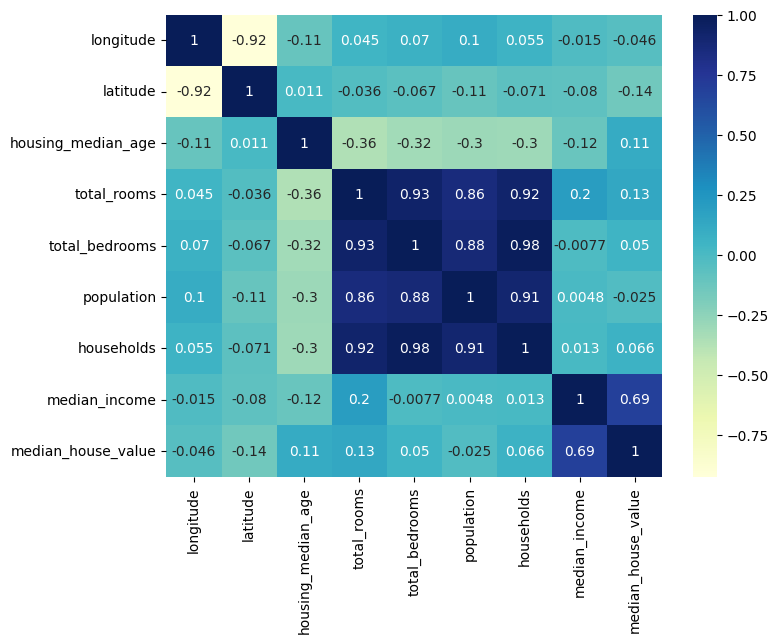

In [ ]:
plt.figure(figsize=(8,6))
sns.heatmap(df.corr(),cmap='YlGnBu',annot=True)
plt.show

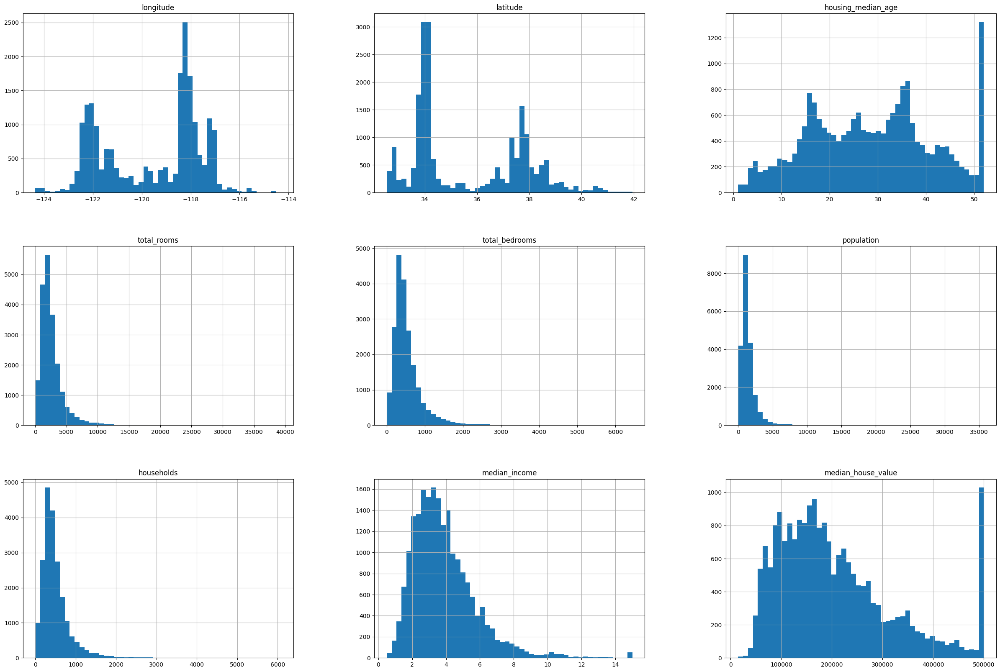

In [ ]:
df.hist(bins = 50 , figsize=(30 , 20))
plt.show()

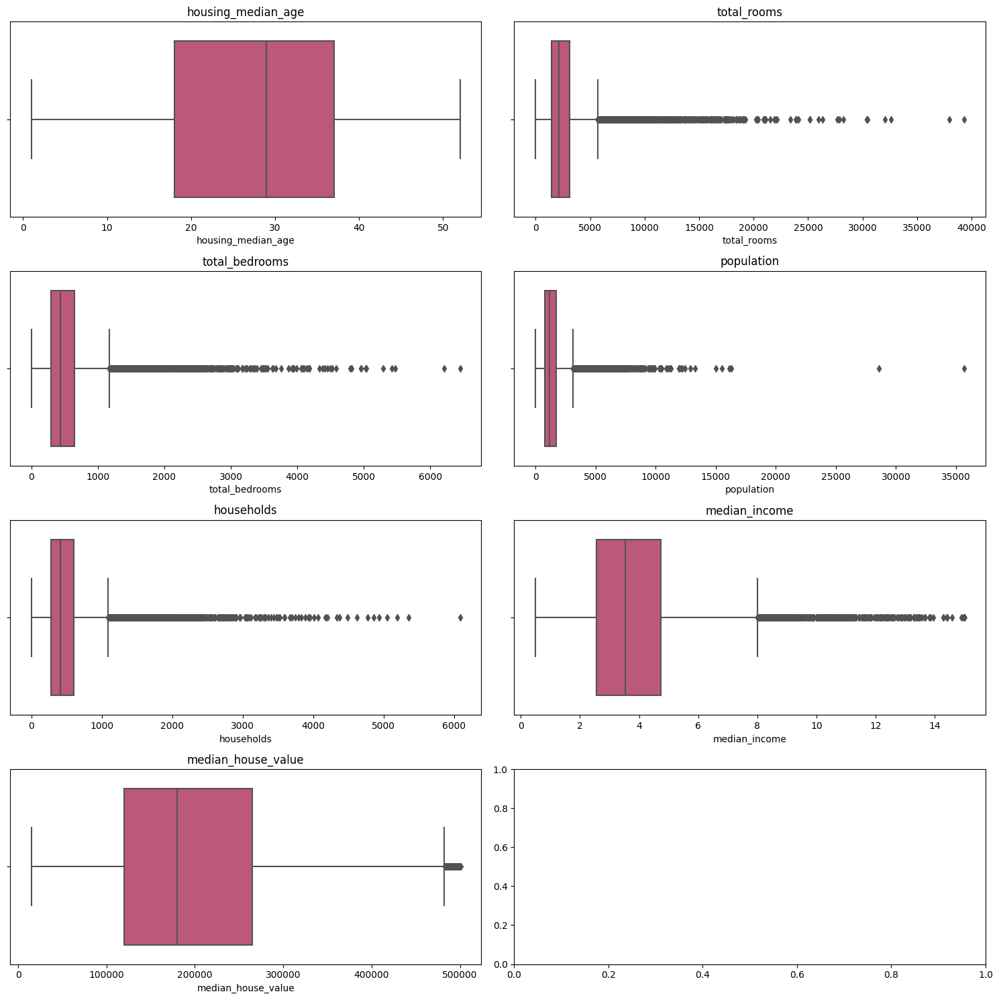

In [ ]:
num_columns = list(df.select_dtypes(include=["int64","float64"]).columns)[2:]

fig, ax = plt.subplots(4,2, figsize = (15,15))
font_dict = {'fontsize': 14}
ax = np.ravel(ax)

for i in num_columns:
    sns.boxplot(data=df,x=i,ax=ax[num_columns.index(i)],palette="plasma").set_title(i)

ax = np.reshape(ax, (4, 2))
plt.tight_layout()
plt.show()

In [ ]:
#Dropping duplicate values
print("Data shape Before duplicates Values: ",df.shape)
df_new=df.drop_duplicates()
print("Data shape After duplicates Values: ",df_new.shape)

Data shape Before duplicates Values:  (20640, 10)
Data shape After duplicates Values:  (20640, 10)


In [ ]:
#Checking for missing values
missing_values_df = df.isnull().sum()
print(missing_values_df)

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64


In [ ]:
#Percentage of missing data by feature

df_na = (missing_values_df / len(df)) * 100

# drop columns without missing values
df_na = df_na.drop(df_na[df_na == 0].index)

#sort
df_na=df_na.sort_values(ascending=False)

print("Percentage of missing values in {} : {} %".format(df_na.index[0],df_na[0]))

total_cells = np.product(df.shape)

total_missing = missing_values_df.sum()

print("percent of data that is missing from all Dataset: {}%".format(round((total_missing/total_cells) * 100,ndigits=2)))

Percentage of missing values in total_bedrooms : 1.002906976744186 %
percent of data that is missing from all Dataset: 0.1%


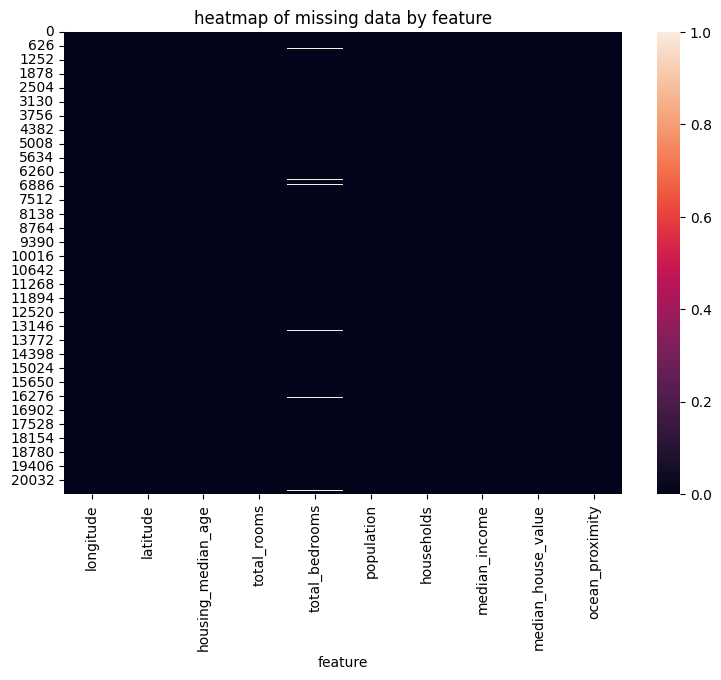

In [ ]:
# create plot
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(df.isnull())
ax.set(title='heatmap of missing data by feature', xlabel='feature')
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder , OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

In [ ]:
# Preprocess the data (replace this with your preprocessing steps)
X = df.drop(columns=["median_house_value"])
y = df["median_house_value"]

In [ ]:
#Filling the missing values

In [ ]:
df.sample(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
5987,-117.72,34.10,52.0,2867.0,496.0,978.0,513.0,3.1477,291200.0,INLAND
7788,-118.06,33.89,26.0,2483.0,412.0,1538.0,449.0,5.1104,220500.0,<1H OCEAN
10677,-117.77,33.54,47.0,3090.0,652.0,1105.0,582.0,4.1699,373700.0,<1H OCEAN
14190,-117.07,32.71,26.0,4151.0,823.0,2822.0,697.0,2.8372,123400.0,NEAR OCEAN
2347,-119.68,36.80,7.0,2855.0,518.0,1748.0,498.0,4.2066,88400.0,INLAND
1414,-122.09,37.95,32.0,1339.0,209.0,601.0,209.0,6.0265,247900.0,NEAR BAY
648,-122.13,37.72,25.0,1134.0,153.0,340.0,171.0,6.5095,371200.0,NEAR BAY
17470,-119.81,34.47,26.0,4382.0,618.0,1728.0,587.0,7.4734,432200.0,NEAR OCEAN
2149,-119.77,36.77,29.0,2554.0,705.0,2669.0,655.0,1.2176,61900.0,INLAND
1253,-122.01,39.21,50.0,1592.0,372.0,781.0,307.0,2.2679,69100.0,INLAND


In [ ]:
def Zscore_outlier(column,df,scale=3.75):
    out=[]
    m = np.mean(df[column])
    sd = np.std(df[column])
    for i in df[column]:
        z = (i-m)/sd
        if np.abs(z) > scale:
            out.append(i)
    df=df[df[column].isin(out) == False]
    return df

bedrooms to total ratio mean :  0.21303883048085132
bedrooms to total ratio mean :  0.210720927358447


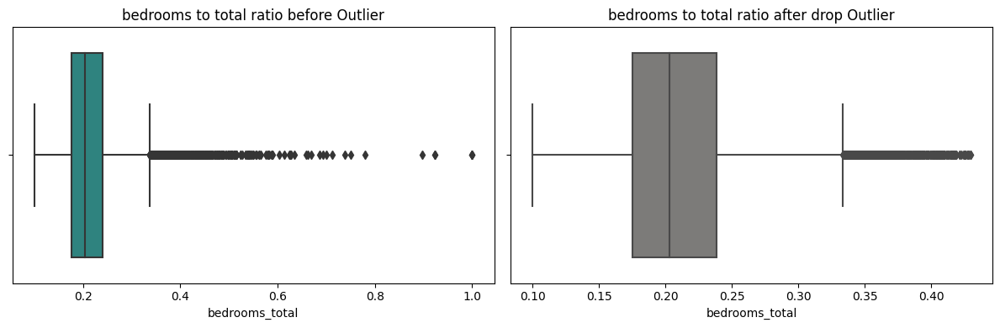

In [ ]:
fig, ax = plt.subplots(1,2, figsize = (12,4))
font_dict = {'fontsize': 14}
ax = np.ravel(ax)

bedrooms_total=pd.DataFrame(df_new['total_bedrooms']/df_new['total_rooms'],columns=["bedrooms_total"])

print("bedrooms to total ratio mean : ",bedrooms_total.mean()[0])

sns.boxplot(data=bedrooms_total,x='bedrooms_total',palette='viridis', ax=ax[0]).set_title('bedrooms to total ratio before Outlier')

bedrooms_total=Zscore_outlier(column='bedrooms_total',df=bedrooms_total)

print("bedrooms to total ratio mean : ",bedrooms_total.mean()[0])

sns.boxplot(data=bedrooms_total,x='bedrooms_total',palette='cividis', ax=ax[1]).set_title('bedrooms to total ratio after drop Outlier')
ax = np.reshape(ax, (1, 2))
plt.tight_layout()
plt.show()
bedrooms_total=bedrooms_total.mean()[0]


In [ ]:
df_new['total_bedrooms']=df_new['total_bedrooms'].fillna(bedrooms_total*df_new['total_rooms'])

In [ ]:
df_new.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

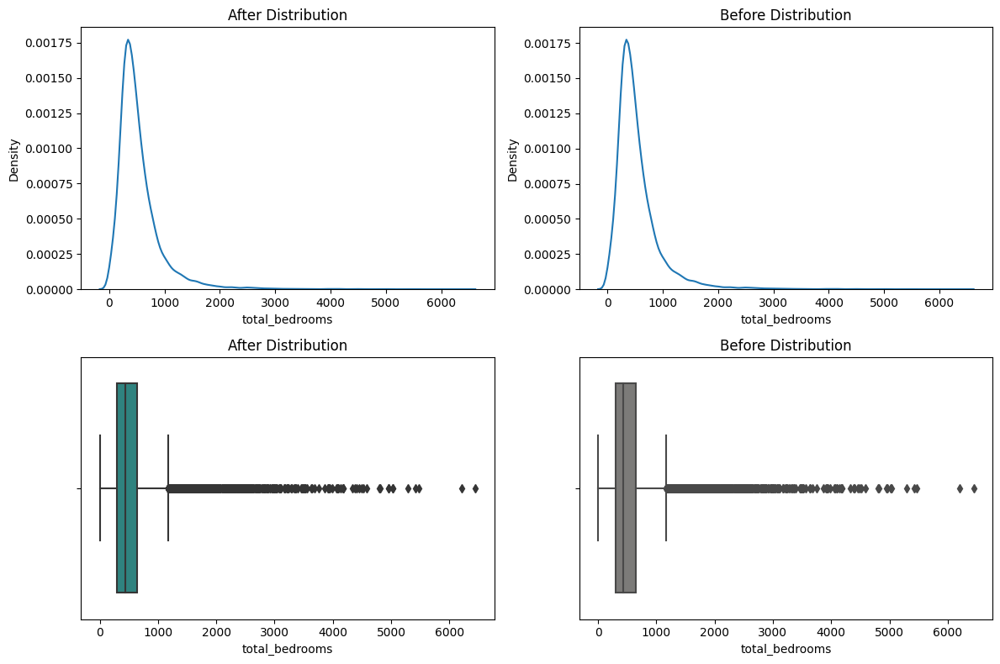

In [ ]:
#Plotting the data distribution before and after filling missing values
fig, ax = plt.subplots(2,2, figsize = (12,8))
font_dict = {'fontsize': 14}

ax = np.ravel(ax)
sns.kdeplot(data=df_new,x='total_bedrooms',ax = ax[0]).set_title('After Distribution')
sns.kdeplot(data=df,x='total_bedrooms',ax = ax[1]).set_title('Before Distribution')
sns.boxplot(data=df_new,x='total_bedrooms', ax=ax[2],palette='viridis').set_title('After Distribution')
sns.boxplot(data=df,x='total_bedrooms', ax=ax[3],palette='cividis').set_title('Before Distribution')

ax = np.reshape(ax, (2, 2))
plt.tight_layout()
plt.show()

In [ ]:
data=df_new.copy()
df_new.shape

(20640, 10)

Outlier detection and removal

In [ ]:
def Distribution2(columne,data,i):
    fig, ax = plt.subplots(1,3, figsize = (15,5))
    font_dict = {'fontsize': 14}
    title=['Before Distribution','After Distribution']
    ax = np.ravel(ax)
    if i==1:
        sns.set(style='whitegrid')
        sns.kdeplot(data=data,x=columne ,ax = ax[0],color='r').set_title(title[i])
        sns.boxplot(data=data,x=columne ,ax = ax[1],palette='magma').set_title(title[i])
        sns.scatterplot(data=data,x=columne ,ax = ax[2], y=data['median_house_value'],color='r').set_title(title[i])
    else:
        sns.set(style='whitegrid')
        sns.kdeplot(data=data,x=columne ,ax = ax[0],color='#2171b5').set_title(title[i])
        sns.boxplot(data=data,x=columne ,ax = ax[1],color='#2171b5').set_title(title[i])
        sns.scatterplot(data=data,x=columne ,ax = ax[2], y=data['median_house_value'],color='#2171b5').set_title(title[i])

    ax = np.reshape(ax, (1, 3))
    plt.tight_layout()

1. Total bedrooms

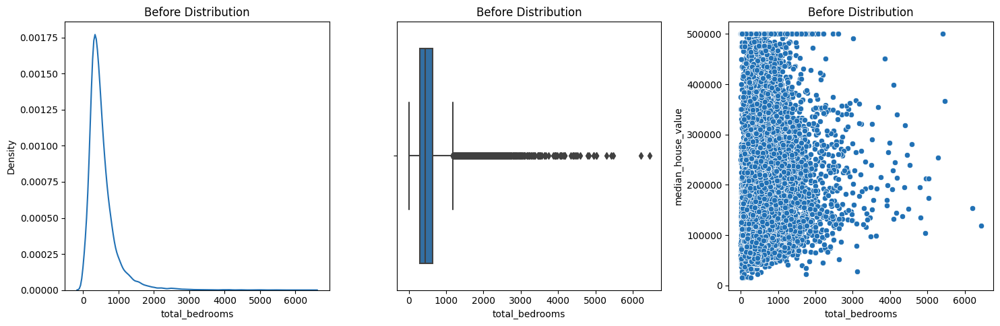

In [ ]:
Distribution2(columne='total_bedrooms',data=data,i=0)

In [ ]:
data[data['total_bedrooms']>=2800].shape

(90, 10)

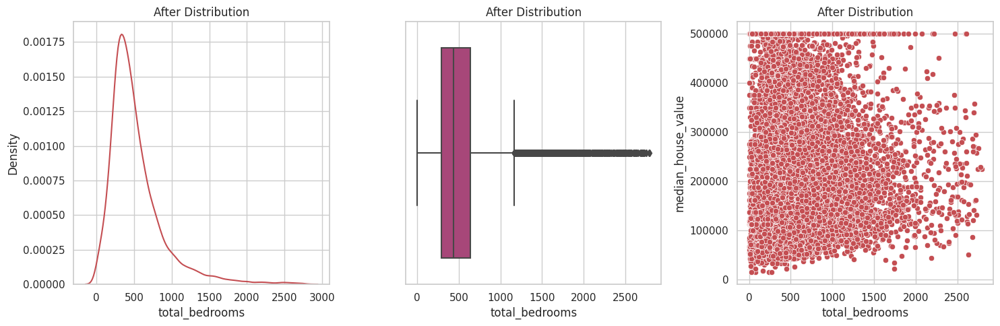

In [ ]:
data=data[data['total_bedrooms']<2800]
Distribution2(columne='total_bedrooms',data=data,i=1)

2. Total Rooms

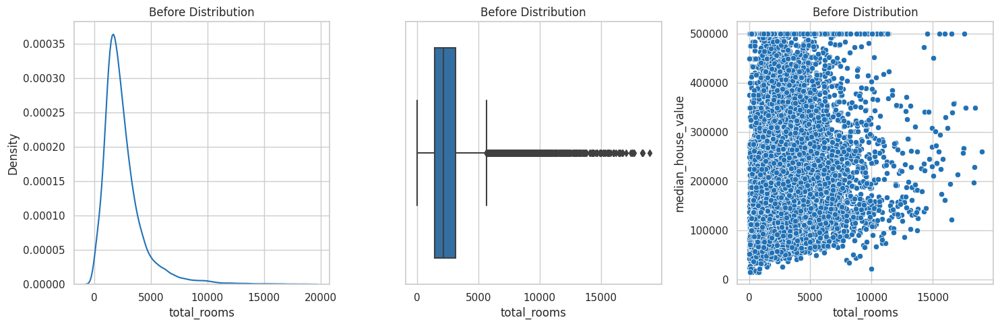

In [ ]:
Distribution2(columne='total_rooms',data=data,i=0)

In [ ]:
data[data['total_rooms']>=15000].shape

(31, 10)

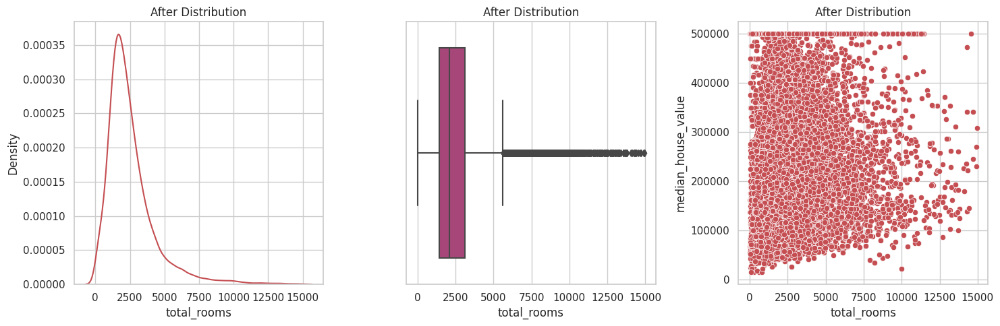

In [ ]:
data=data[data['total_rooms']<15000]
Distribution2(columne='total_rooms',data=data,i=1)

3. Housing_median_age

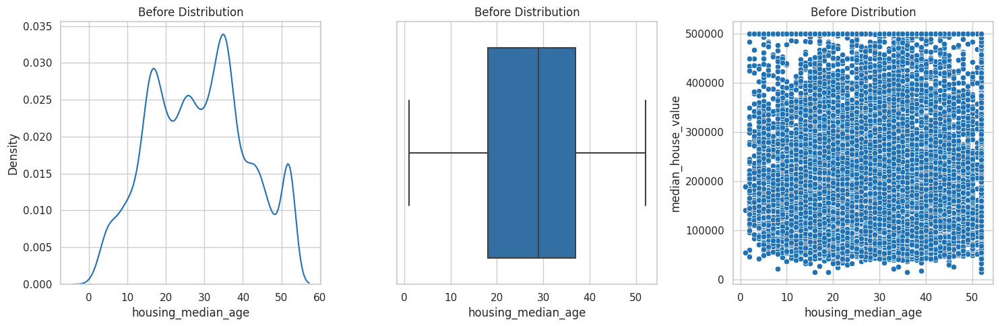

In [ ]:
Distribution2(columne='housing_median_age',data=data,i=0)

No Outliers

4. Population

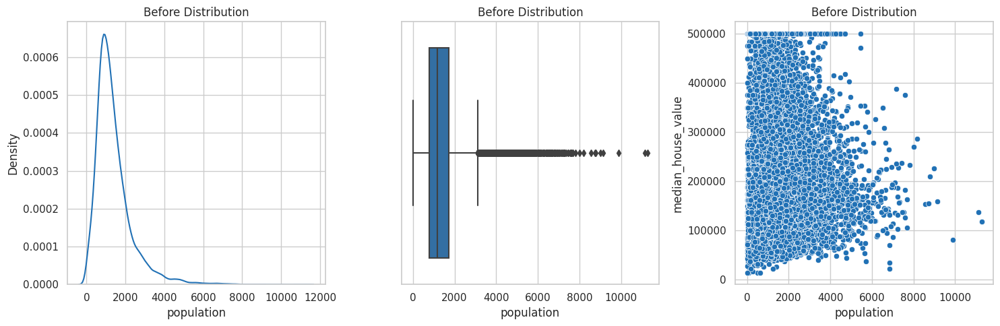

In [ ]:
Distribution2(columne='population',data=data,i=0)

In [ ]:
data[data['population']>=6000].shape

(88, 10)

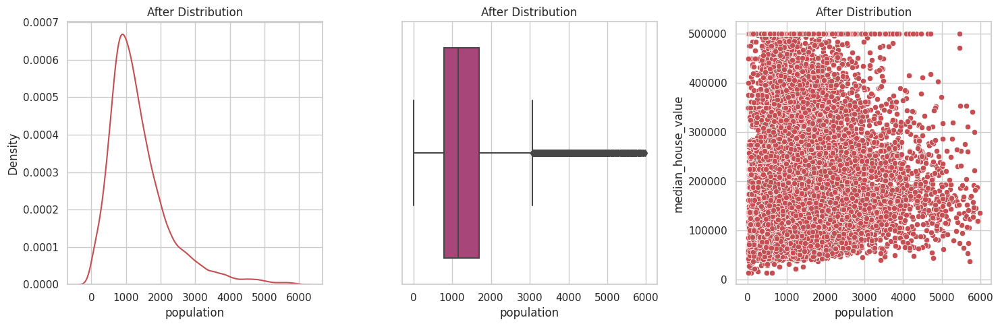

In [ ]:
data=data[data['population']< 6000]
Distribution2(columne='population',data=data,i=1)

5. Household

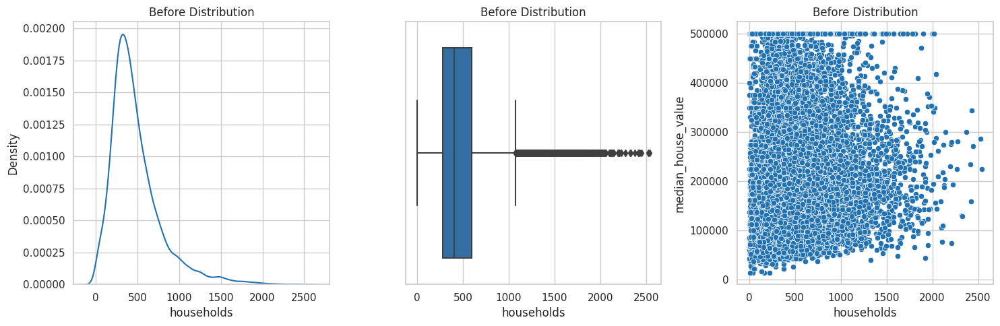

In [ ]:
Distribution2(columne='households',data=data,i=0)

In [ ]:
data[data['households']>=2000].shape

(38, 10)

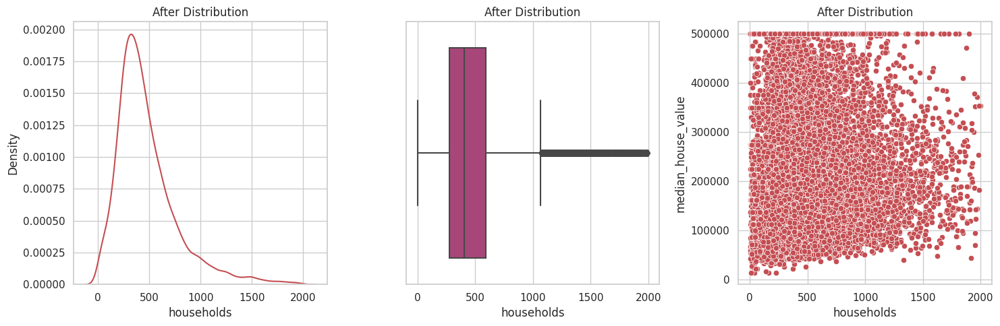

In [ ]:
data=data[data['households']<2000]
Distribution2(columne='households',data=data,i=1)

6. Median income

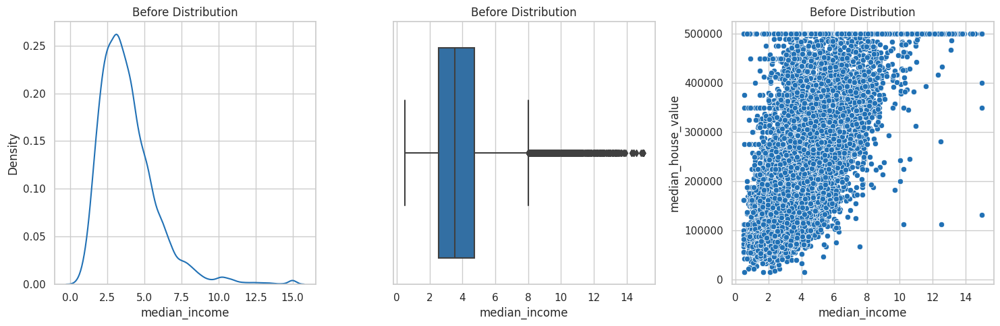

In [ ]:
Distribution2(columne='median_income',data=data,i=0)

In [ ]:
data[data['median_income']>=9].shape

(405, 10)

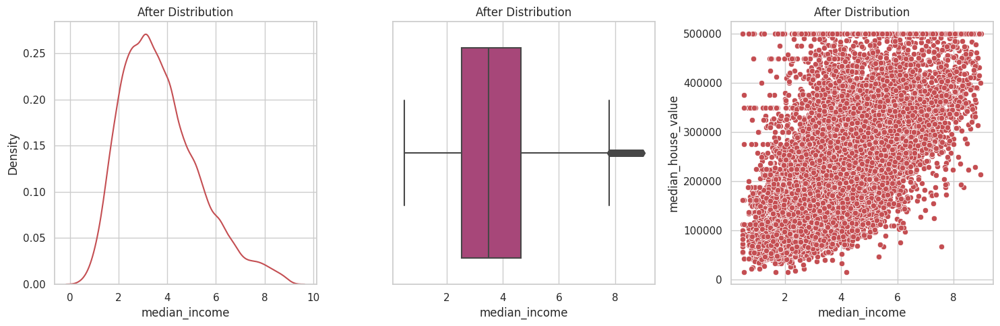

In [ ]:
data=data[data['median_income']< 9]
Distribution2(columne='median_income',data=data,i=1)

7. Median house values

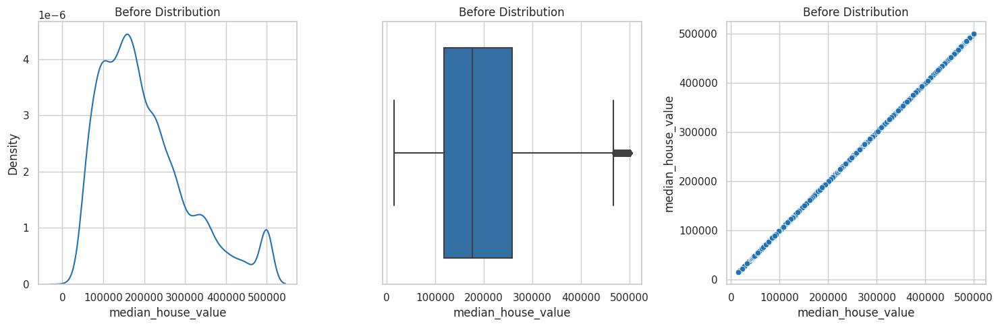

In [ ]:
Distribution2(columne='median_house_value',data=data,i=0)

The leftmost graph shows the raw data, with no transformations. The graph is skewed to the right, with a long tail at the high end. This means that there are more houses with lower median house values than there are houses with higher median house values.

The middle graph shows the data after a log transformation. The log transformation compresses the high end of the distribution, making the graph more symmetrical. This is because the log transformation takes the logarithm of the median house value, which compresses the values for higher median house values.

The rightmost graph shows the data after a square root transformation. The square root transformation compresses the low end of the distribution, making the graph more symmetrical. This is because the square root transformation takes the square root of the median house value, which compresses the values for lower median house values.

In [ ]:
data[data['median_house_value']<=10.45].shape

(0, 10)

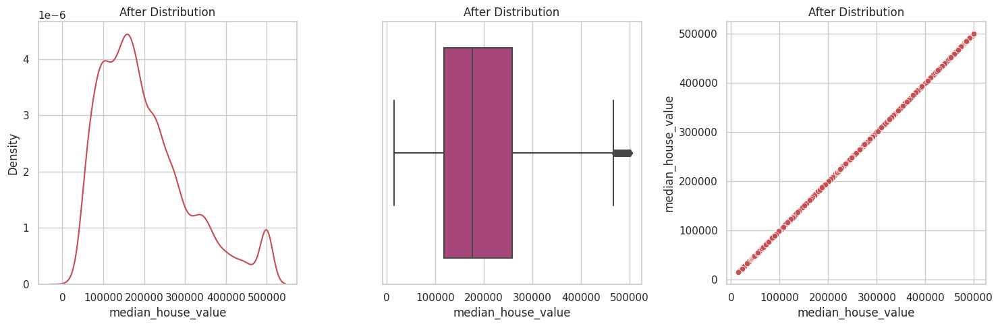

In [ ]:
data=data[data['median_house_value']> 10.45]
Distribution2(columne='median_house_value',data=data,i=1)

In [ ]:
# Checking the shape after outlier removal
data.shape

(19988, 10)

In [ ]:
# show the correlation between columns
data.corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924128,-0.104504,0.029505,0.060763,0.109990,0.047424,-0.014634,-0.046722
latitude,-0.924128,1.000000,0.005711,-0.021900,-0.062767,-0.125783,-0.071532,-0.082283,-0.146260
housing_median_age,-0.104504,0.005711,1.000000,-0.365786,-0.311297,-0.288596,-0.288837,-0.150201,0.114163
total_rooms,0.029505,-0.021900,-0.365786,1.000000,0.914142,0.816595,0.897964,0.249501,0.156273
total_bedrooms,0.060763,-0.062767,-0.311297,0.914142,1.000000,0.852922,0.971288,0.000720,0.076077
population,0.109990,-0.125783,-0.288596,0.816595,0.852922,1.000000,0.891686,0.009449,-0.027572
households,0.047424,-0.071532,-0.288837,0.897964,0.971288,0.891686,1.000000,0.028232,0.094222
median_income,-0.014634,-0.082283,-0.150201,0.249501,0.000720,0.009449,0.028232,1.000000,0.649249
median_house_value,-0.046722,-0.146260,0.114163,0.156273,0.076077,-0.027572,0.094222,0.649249,1.000000


In [ ]:
data.corr()['median_house_value'].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.649249
total_rooms           0.156273
housing_median_age    0.114163
households            0.094222
total_bedrooms        0.076077
population           -0.027572
longitude            -0.046722
latitude             -0.146260
Name: median_house_value, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

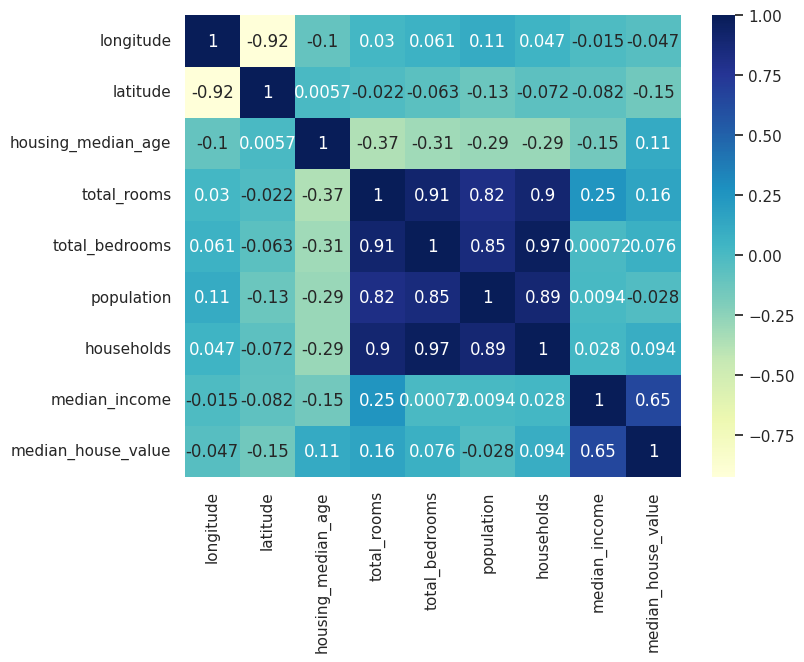

In [ ]:
#visualize the correlation
plt.figure(figsize=(8,6))
sns.heatmap(data.corr(),cmap='YlGnBu',annot=True)
plt.show

In [ ]:
import tensorflow as tf
import tensorflow_data_validation as tfdv
print('TF version:', tf.__version__)
print('TFDV version:', tfdv.version.__version__)

TF version: 2.14.0
TFDV version: 1.14.0


In [ ]:
from tensorflow.python.lib.io import file_io
from tensorflow_data_validation.utils import slicing_util
from tensorflow_metadata.proto.v0.statistics_pb2 import DatasetFeatureStatisticsList, DatasetFeatureStatistics
import pandas as pd

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error , mean_absolute_percentage_error , mean_squared_error
from sklearn.metrics import r2_score

In [ ]:
# Split the dataset. Do not shuffle for this demo notebook.
train_df, eval_df = train_test_split(df, test_size=0.2, shuffle=False)

In [ ]:
# Preview the train set
train_df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [ ]:
# Preview the eval set
eval_df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
16512,-121.22,37.72,34.0,2123.0,387.0,1310.0,368.0,2.6368,165600.0,INLAND
16513,-121.22,37.81,17.0,2879.0,542.0,1802.0,530.0,3.6378,126100.0,INLAND
16514,-121.22,37.80,28.0,2608.0,576.0,1719.0,554.0,2.1186,94400.0,INLAND
16515,-121.22,37.80,37.0,1038.0,222.0,521.0,211.0,2.1250,91900.0,INLAND
16516,-121.21,37.81,18.0,2404.0,498.0,1531.0,506.0,2.9950,124300.0,INLAND


In [ ]:
# Generate training dataset statistics
train_stats = tfdv.generate_statistics_from_dataframe(train_df)

In [ ]:
# Visualize training dataset statistics
tfdv.visualize_statistics(train_stats)

In [ ]:

# Infer schema from the computed statistics.
schema = tfdv.infer_schema(statistics=train_stats)

# Display the inferred schema
tfdv.display_schema(schema)

,Type,Presence,Valency,Domain
Feature name,,,,
'longitude',FLOAT,required,,-
'latitude',FLOAT,required,,-
'housing_median_age',FLOAT,required,,-
'total_rooms',FLOAT,required,,-
'total_bedrooms',FLOAT,optional,single,-
'population',FLOAT,required,,-
'households',FLOAT,required,,-
'median_income',FLOAT,required,,-
'median_house_value',FLOAT,required,,-


,Values
Domain,
'ocean_proximity',"'<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'"


In [ ]:
# Generate evaluation dataset statistics
eval_stats = tfdv.generate_statistics_from_dataframe(eval_df)

# Compare training with evaluation
tfdv.visualize_statistics(
    lhs_statistics=eval_stats,
    rhs_statistics=train_stats,
    lhs_name='EVAL_DATASET',
    rhs_name='TRAIN_DATASET'
)

In [ ]:
#Generate Evalaution dataset statistics
eval_stats = tfdv.generate_statistics_from_dataframe(eval_df)

#Compairing training with evalution
tfdv.visualize_statistics(
    lhs_statistics=eval_stats,
    rhs_statistics= train_stats,
    lhs_name='EVAL_DATASET',
    rhs_name='TRAIN_DATASET'
)

In [ ]:
# Feature Engineering

In [ ]:
one_hot_encoders_data =  pd.get_dummies(data)
one_hot_encoders_data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0


In [ ]:
# a structured approach
cols = one_hot_encoders_data.columns
data = pd.DataFrame(one_hot_encoders_data,columns= cols)
data.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
20251,-119.18,34.23,16.0,4609.0,1220.0,2147.0,1007.0,3.3750,218800.0,0,0,0,0,1
17296,-119.53,34.41,8.0,1705.0,400.0,886.0,391.0,3.9659,297400.0,1,0,0,0,0
10116,-117.93,33.94,28.0,3664.0,719.0,1820.0,657.0,4.2250,224700.0,1,0,0,0,0
12974,-121.33,38.67,17.0,2683.0,704.0,1410.0,659.0,1.9620,130200.0,0,1,0,0,0
6718,-118.16,34.13,36.0,4003.0,647.0,1337.0,631.0,7.7230,500001.0,1,0,0,0,0


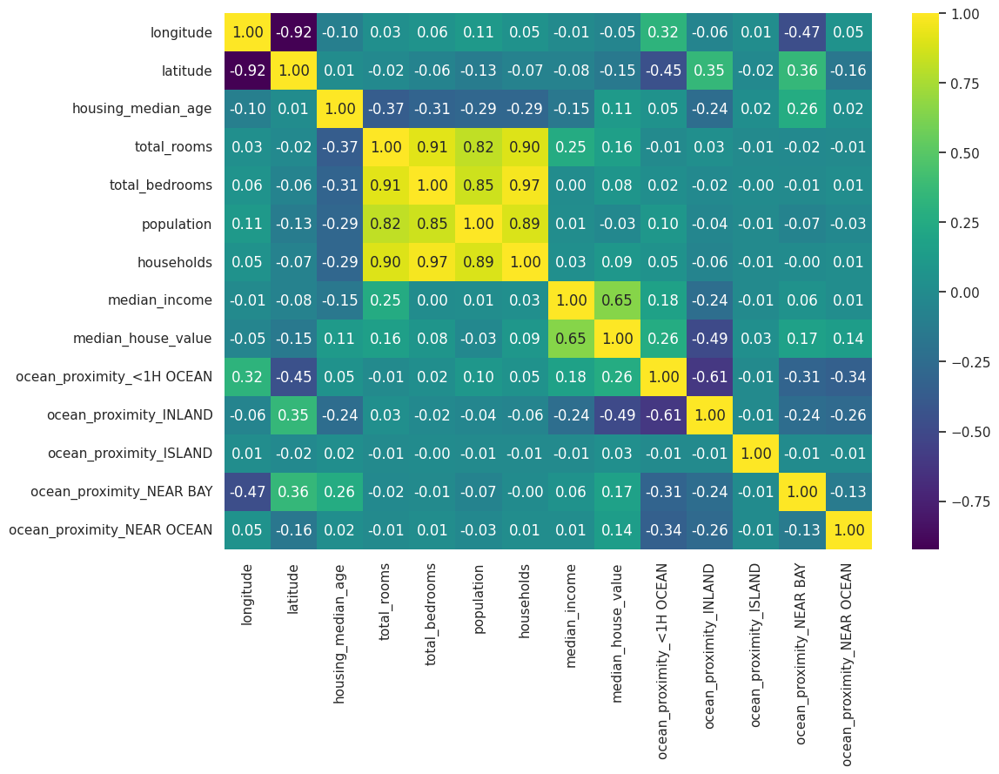

In [ ]:
# Dropping the unwanted columns
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(),annot=True,fmt='.2f',cmap='viridis')

plt.show()

In [ ]:
data.drop(['longitude','latitude'],axis=1,inplace=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19988 entries, 0 to 20639
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   housing_median_age          19988 non-null  float64
 1   total_rooms                 19988 non-null  float64
 2   total_bedrooms              19988 non-null  float64
 3   population                  19988 non-null  float64
 4   households                  19988 non-null  float64
 5   median_income               19988 non-null  float64
 6   median_house_value          19988 non-null  float64
 7   ocean_proximity_<1H OCEAN   19988 non-null  uint8  
 8   ocean_proximity_INLAND      19988 non-null  uint8  
 9   ocean_proximity_ISLAND      19988 non-null  uint8  
 10  ocean_proximity_NEAR BAY    19988 non-null  uint8  
 11  ocean_proximity_NEAR OCEAN  19988 non-null  uint8  
dtypes: float64(7), uint8(5)
memory usage: 1.3 MB


In [ ]:
data.columns

Index(['housing_median_age', 'total_rooms', 'total_bedrooms', 'population',
       'households', 'median_income', 'median_house_value',
       'ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN'],
      dtype='object')

In [ ]:
data_=data[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population',
       'households', 'median_income','ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY','ocean_proximity_NEAR OCEAN', 'median_house_value']]

In [ ]:
x = data_.drop(['median_house_value'] , axis = 1)
y= data_['median_house_value' ].values

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder , OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

In [ ]:
from sklearn import preprocessing
scaler_Robust = preprocessing.RobustScaler()
robust_df = scaler_Robust.fit_transform(x)
robust_df = pd.DataFrame(robust_df,columns=list(x.columns ))

In [ ]:
scaler_MinMax = preprocessing.MinMaxScaler()
x = scaler_MinMax.fit_transform(robust_df)

In [ ]:
no_features_columns = len(data.columns)-1

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import linear_model

In [ ]:
x_train , x_test , y_train , y_test = train_test_split(x,y , test_size= 0.3, random_state=4231)

In [ ]:
x_train.shape , x_test.shape ,y_train.shape, y_test.shape

((13991, 11), (5997, 11), (13991,), (5997,))

Using ADAM as an optimizer

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import tensorflow as tf

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

In [ ]:
model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics=["mse", "mae"])

In [ ]:
model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

Epoch 1/100
438/438 [==============================] - 4s 5ms/step - loss: 52799160320.0000 - mse: 52799160320.0000 - mae: 201531.8906 - val_loss: 51540062208.0000 - val_mse: 51540062208.0000 - val_mae: 199799.5312
Epoch 2/100
438/438 [==============================] - 2s 5ms/step - loss: 52303462400.0000 - mse: 52303462400.0000 - mae: 200332.3906 - val_loss: 50580283392.0000 - val_mse: 50580283392.0000 - val_mae: 197443.8125
Epoch 3/100
438/438 [==============================] - 2s 4ms/step - loss: 50687000576.0000 - mse: 50687000576.0000 - mae: 196354.3125 - val_loss: 48296644608.0000 - val_mse: 48296644608.0000 - val_mae: 191720.8906
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 47631368192.0000 - mse: 47631368192.0000 - mae: 188630.9375 - val_loss: 44551176192.0000 - val_mse: 44551176192.0000 - val_mae: 181949.4688
Epoch 5/100
438/438 [==============================] - 2s 5ms/step - loss: 43146575872.0000 - mse: 43146575872.0000 - mae: 176716.9531 - val

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 11)                132       
                                                                 
 dense_1 (Dense)             (None, 30)                360       
                                                                 
 dense_2 (Dense)             (None, 1)                 31        
                                                                 
Total params: 523 (2.04 KB)
Trainable params: 523 (2.04 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

188/188 [==============================] - 1s 2ms/step


0.576534896264797

In [ ]:
losses=pd.DataFrame(model_history.history)

In [ ]:
losses.head()

,loss,mse,mae,val_loss,val_mse,val_mae
0,5.279916e+10,5.279916e+10,201531.890625,5.154006e+10,5.154006e+10,199799.531250
1,5.230346e+10,5.230346e+10,200332.390625,5.058028e+10,5.058028e+10,197443.812500
2,5.068700e+10,5.068700e+10,196354.312500,4.829664e+10,4.829664e+10,191720.890625
3,4.763137e+10,4.763137e+10,188630.937500,4.455118e+10,4.455118e+10,181949.468750
4,4.314658e+10,4.314658e+10,176716.953125,3.950759e+10,3.950759e+10,167913.484375


import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_0, *['loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_1, *['mse'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_2, *['mae'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_3, *['val_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(_df_4, *['loss', 'mse'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(_df_5, *['mse', 'mae'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(_df_6, *['mae', 'val_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(_df_7, *['val_loss', 'val_mse'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_8, *['loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_9, *['mse'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_10, *['mae'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_11, *['val_loss'], **{})
chart

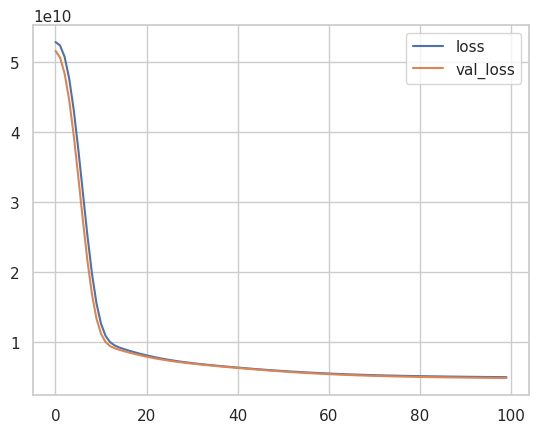

In [ ]:
losses[['loss','val_loss']].plot()
plt.show()

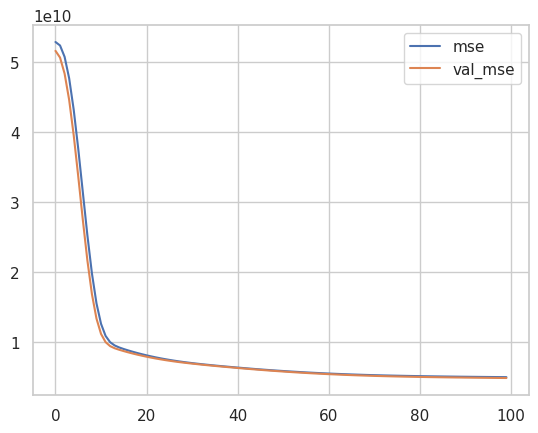

In [ ]:
losses[['mse','val_mse']].plot()
plt.show()

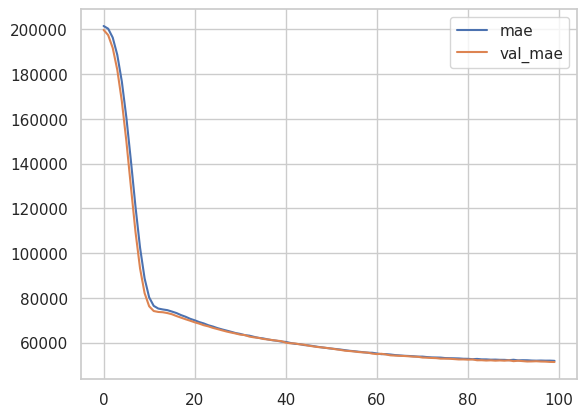

In [ ]:
losses[['mae','val_mae']].plot()
plt.show()

In [ ]:
mape=mean_absolute_percentage_error(y_test,y_pred)
mape

0.29510907295490485

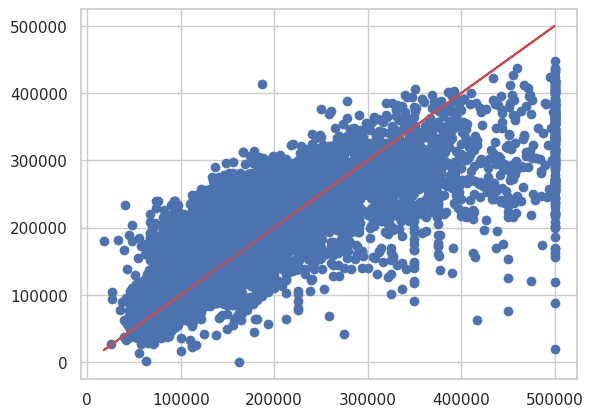

In [ ]:
plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

In [ ]:
model.evaluate(x_test,y_test,verbose=0)

[4922285568.0, 4922285568.0, 51287.73046875]

In [ ]:
model.evaluate(x_train,y_train,verbose=0)

[5041020416.0, 5041020416.0, 51720.7734375]

In [ ]:
single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house

1/1 [==============================] - 0s 30ms/step


array([[241328.06]], dtype=float32)

In [ ]:
data['median_house_value'].iloc[10]

281500.0

In [ ]:
df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

,y_pred,y_test
68,147215.187500,260400.0
1383,274091.812500,342200.0
3894,147634.609375,108600.0
338,137471.671875,83400.0
1372,319078.062500,500001.0
2309,190801.609375,321400.0
5777,307454.625000,238700.0
5098,287805.468750,205100.0
4919,193280.375000,178600.0
5719,166172.406250,95800.0


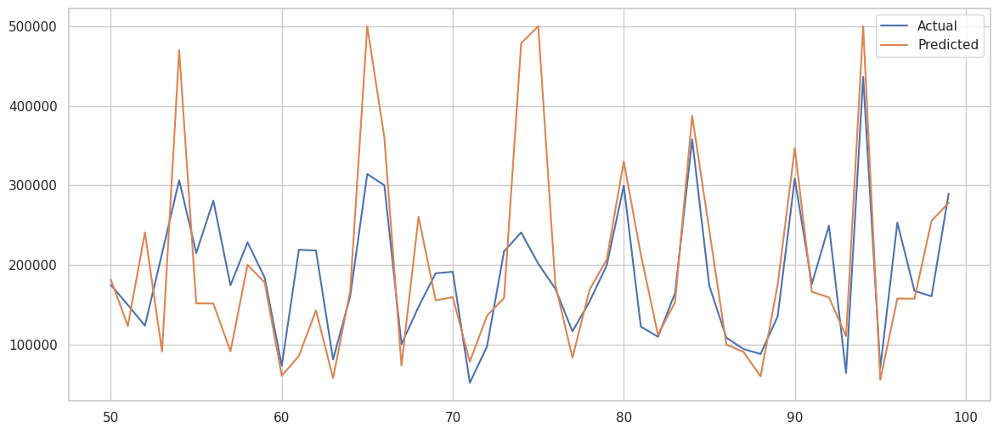

In [ ]:
plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu'),
])

In [ ]:
model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics=["mse", "mae"])

In [ ]:
model.summary()

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_98 (Dense)            (None, 1)                 12        
                                                                 
Total params: 12 (48.00 Byte)
Trainable params: 12 (48.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 52833275904.0000 - mse: 52833275904.0000 - mae: 201614.0625 - val_loss: 51680477184.0000 - val_mse: 51680477184.0000 - val_mae: 200141.6250
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 52832538624.0000 - mse: 52832538624.0000 - mae: 201612.2656 - val_loss: 51679760384.0000 - val_mse: 51679760384.0000 - val_mae: 200139.8281
Epoch 3/100
438/438 [==============================] - 2s 4ms/step - loss: 52831817728.0000 - mse: 52831817728.0000 - mae: 201610.5156 - val_loss: 51679072256.0000 - val_mse: 51679072256.0000 - val_mae: 200138.2344
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 52831145984.0000 - mse: 52831145984.0000 - mae: 201608.9375 - val_loss: 51678412800.0000 - val_mse: 51678412800.0000 - val_mae: 200136.5000
Epoch 5/100
438/438 [==============================] - 2s 4ms/step - loss: 52830470144.0000 - mse: 52830470144.0000 - mae: 201607.3438 - val

188/188 [==============================] - 0s 2ms/step


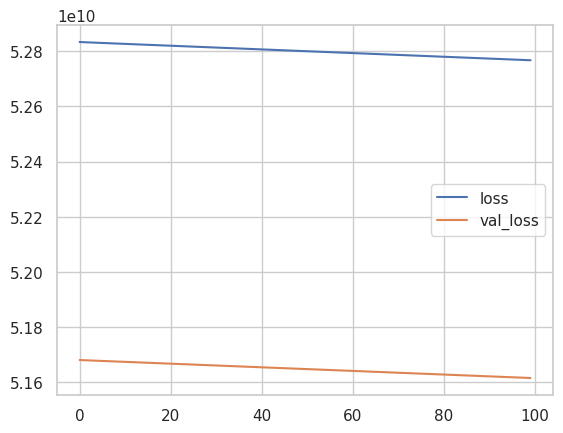

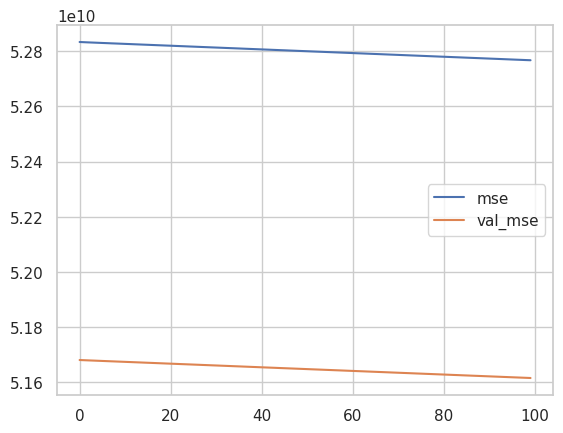

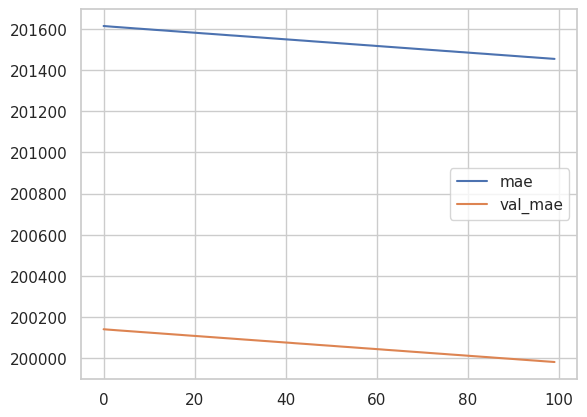

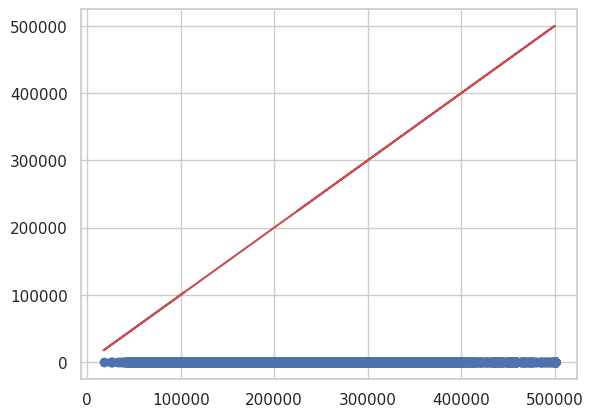

1/1 [==============================] - 0s 24ms/step


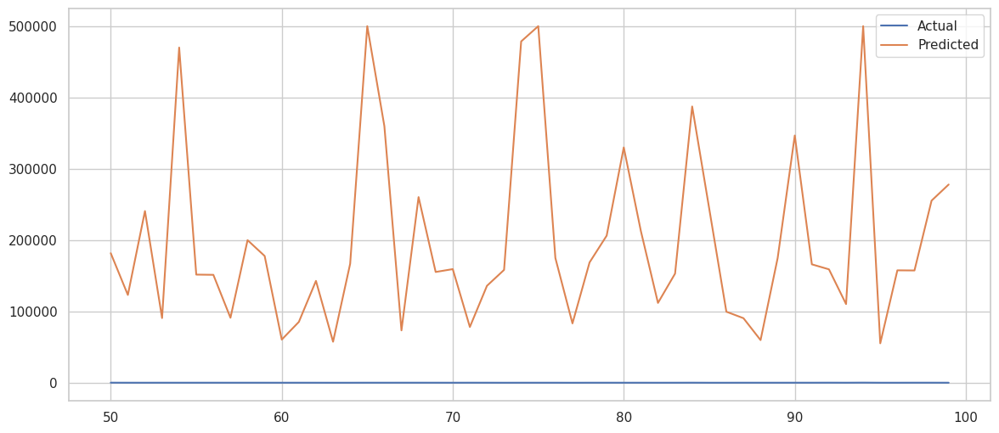

In [ ]:
y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 4ms/step - loss: 48342282240.0000 - mse: 48342282240.0000 - mae: 189658.7500 - val_loss: 30293231616.0000 - val_mse: 30293231616.0000 - val_mae: 138653.3281
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 13960328192.0000 - mse: 13960328192.0000 - mae: 87166.0781 - val_loss: 9084110848.0000 - val_mse: 9084110848.0000 - val_mae: 74092.2578
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 8705969152.0000 - mse: 8705969152.0000 - mae: 72650.6797 - val_loss: 8071731200.0000 - val_mse: 8071731200.0000 - val_mae: 69303.5703
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 7852166144.0000 - mse: 7852166144.0000 - mae: 68290.4375 - val_loss: 7477350912.0000 - val_mse: 7477350912.0000 - val_mae: 66469.2891
Epoch 5/100
438/438 [==============================] - 2s 3ms/step - loss: 7306874880.0000 - mse: 7306874880.0000 - mae: 65262.0703 - val_loss: 7075446784.0

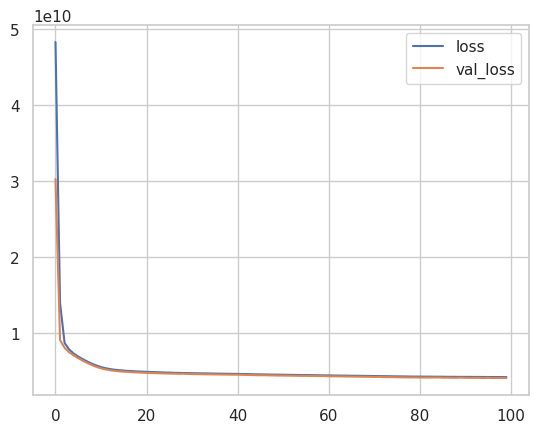

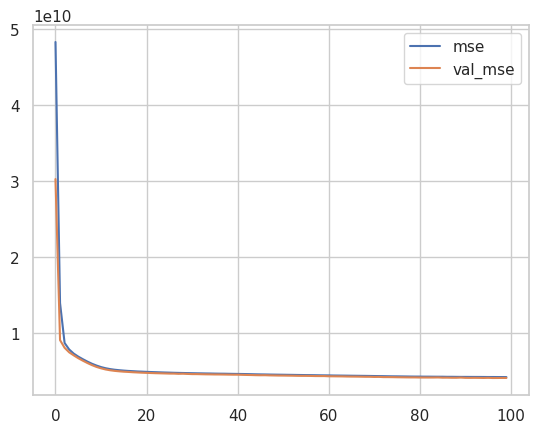

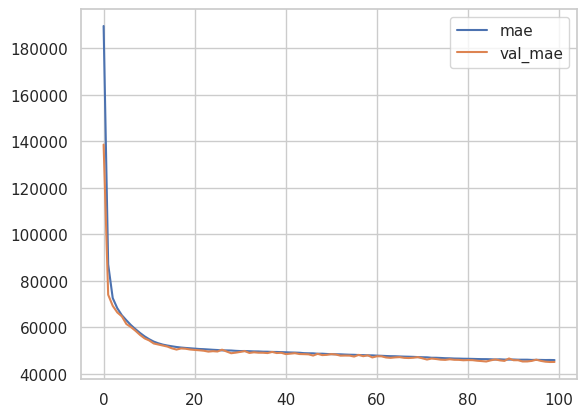

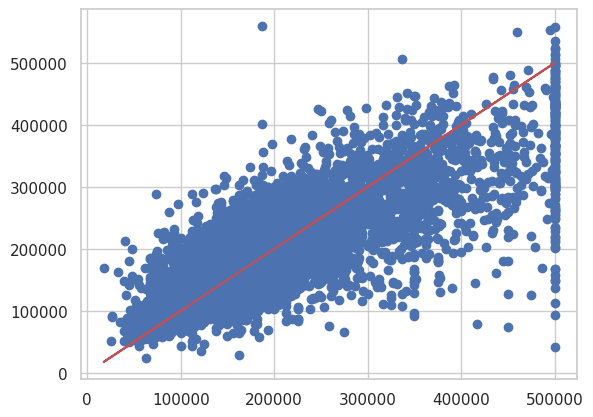

1/1 [==============================] - 0s 31ms/step


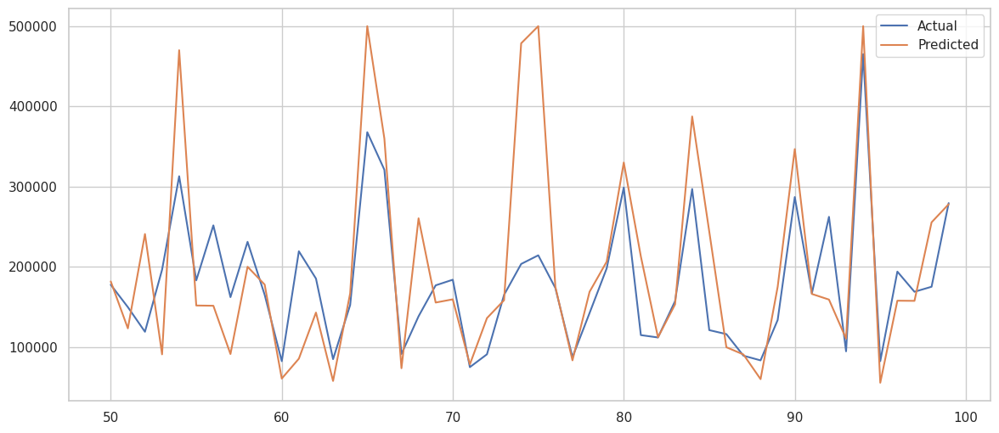

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(100,activation='relu') ,
    Dense(50,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 34641080320.0000 - mse: 34641080320.0000 - mae: 148148.5469 - val_loss: 9602864128.0000 - val_mse: 9602864128.0000 - val_mae: 74036.7891
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 8599745536.0000 - mse: 8599745536.0000 - mae: 71479.9141 - val_loss: 7743778816.0000 - val_mse: 7743778816.0000 - val_mae: 67706.1016
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 7415568896.0000 - mse: 7415568896.0000 - mae: 65748.7422 - val_loss: 7042454016.0000 - val_mse: 7042454016.0000 - val_mae: 63456.8633
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 6796193280.0000 - mse: 6796193280.0000 - mae: 62165.0820 - val_loss: 6505254400.0000 - val_mse: 6505254400.0000 - val_mae: 60962.1445
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 6289873920.0000 - mse: 6289873920.0000 - mae: 59373.1797 - val_loss: 6035062272.0000 -

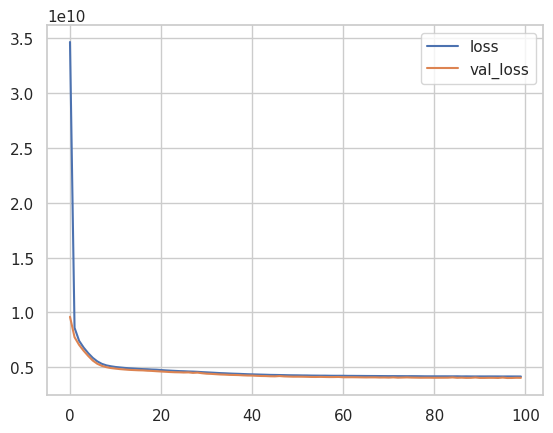

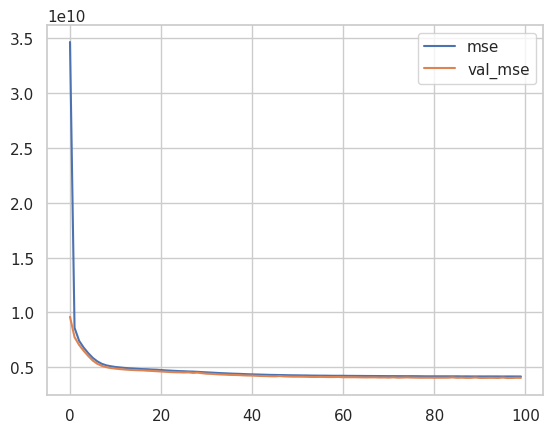

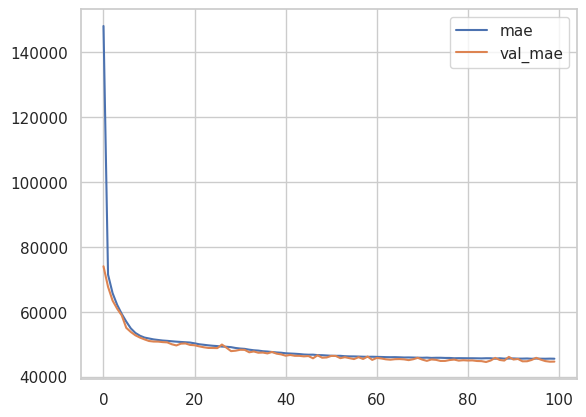

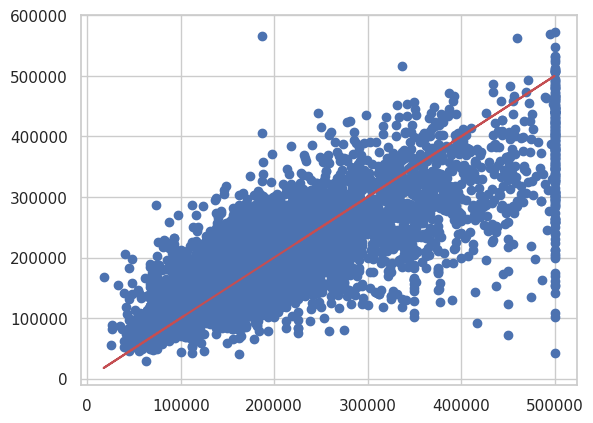

1/1 [==============================] - 0s 20ms/step


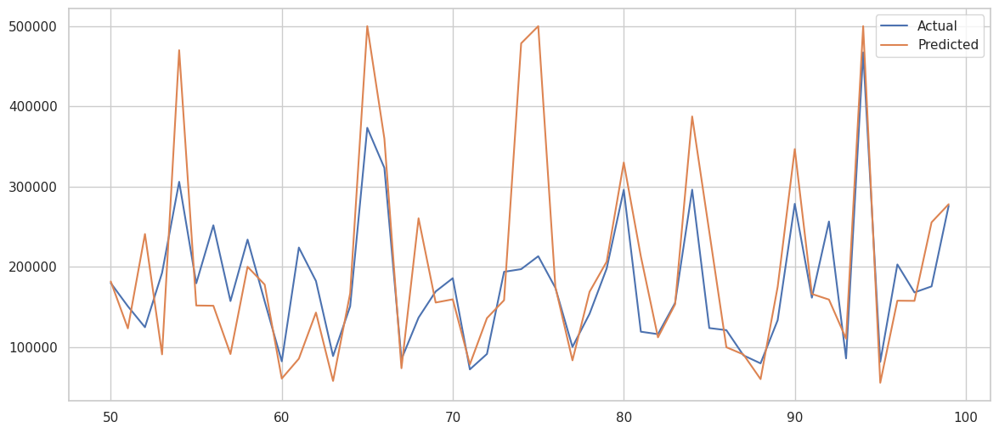

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 3s 5ms/step - loss: 12932948992.0000 - mse: 12932948992.0000 - mae: 81728.6641 - val_loss: 5683863040.0000 - val_mse: 5683863040.0000 - val_mae: 54682.4727
Epoch 2/100
438/438 [==============================] - 2s 4ms/step - loss: 5269591040.0000 - mse: 5269591040.0000 - mae: 53160.4414 - val_loss: 4877732864.0000 - val_mse: 4877732864.0000 - val_mae: 50577.3242
Epoch 3/100
438/438 [==============================] - 2s 5ms/step - loss: 4929236480.0000 - mse: 4929236480.0000 - mae: 51287.6914 - val_loss: 4798966272.0000 - val_mse: 4798966272.0000 - val_mae: 49175.5312
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 4767098880.0000 - mse: 4767098880.0000 - mae: 50162.9727 - val_loss: 4592459264.0000 - val_mse: 4592459264.0000 - val_mae: 49914.0078
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 4674520576.0000 - mse: 4674520576.0000 - mae: 49548.6406 - val_loss: 4506568192.0000 - 

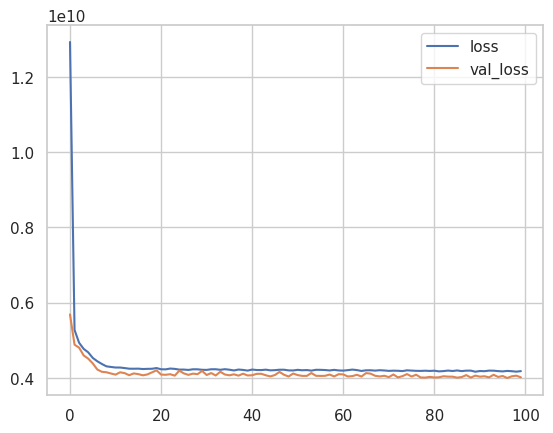

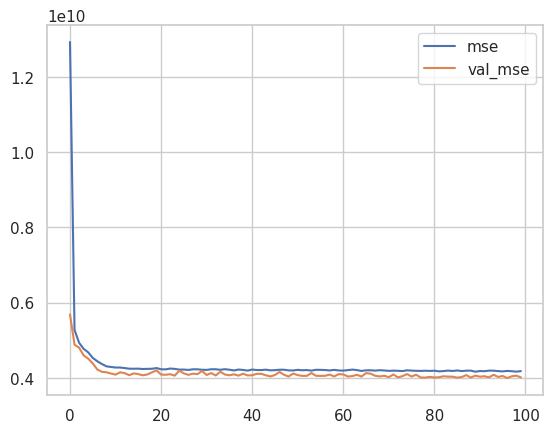

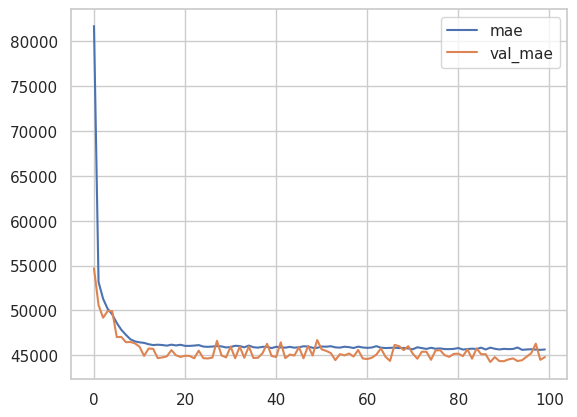

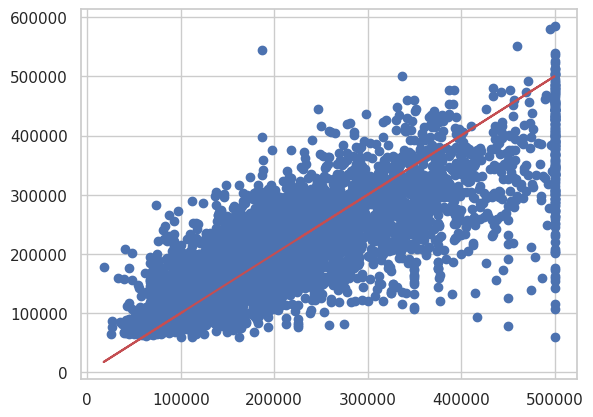

1/1 [==============================] - 0s 20ms/step


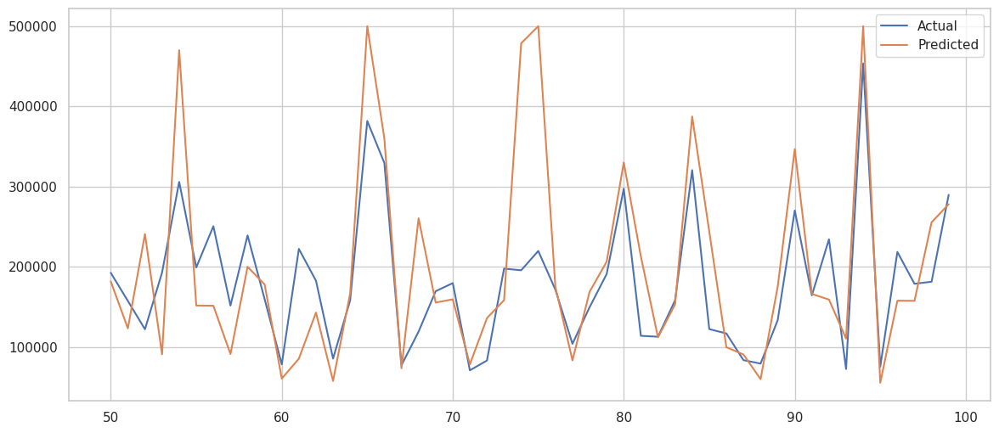

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.1), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Linear

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 52808253440.0000 - mse: 52808253440.0000 - mae: 201553.4531 - val_loss: 51605262336.0000 - val_mse: 51605262336.0000 - val_mae: 199958.0312
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 52657659904.0000 - mse: 52657659904.0000 - mae: 201189.3594 - val_loss: 51386691584.0000 - val_mse: 51386691584.0000 - val_mae: 199423.7656
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 52372840448.0000 - mse: 52372840448.0000 - mae: 200497.7812 - val_loss: 51046690816.0000 - val_mse: 51046690816.0000 - val_mae: 198589.8281
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 51974979584.0000 - mse: 51974979584.0000 - mae: 199530.4531 - val_loss: 50603614208.0000 - val_mse: 50603614208.0000 - val_mae: 197498.2969
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 51478695936.0000 - mse: 51478695936.0000 - mae: 198319.0938 - val

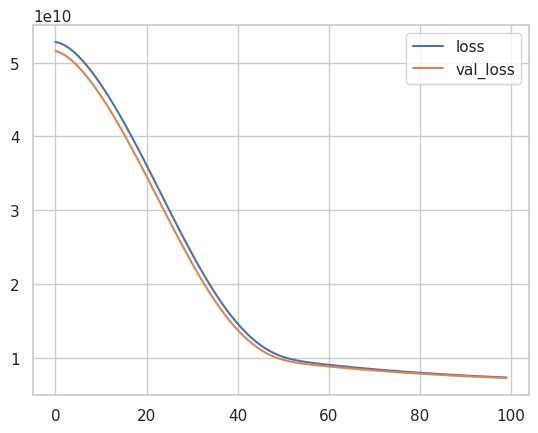

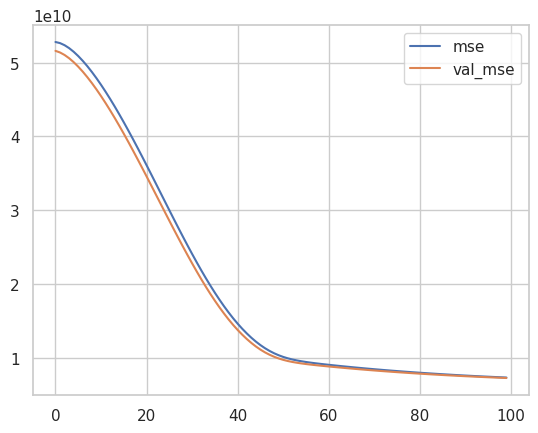

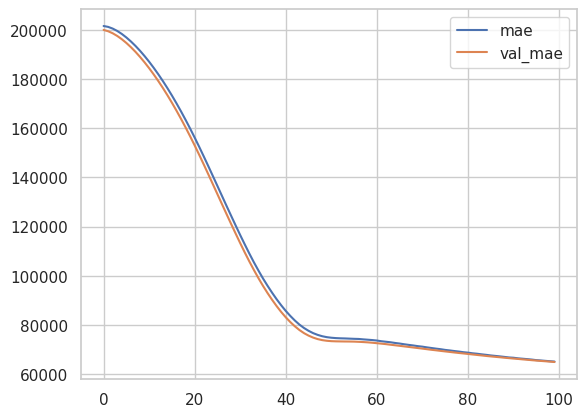

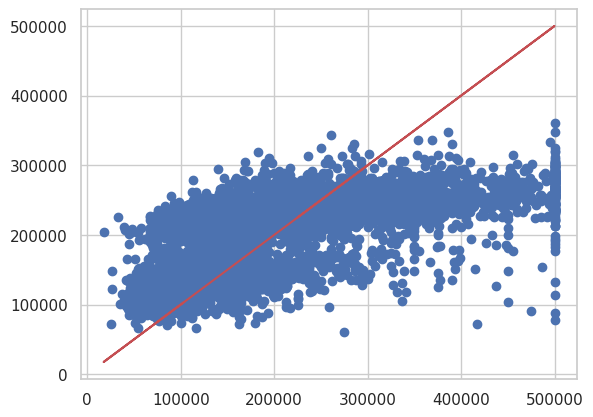

1/1 [==============================] - 0s 21ms/step


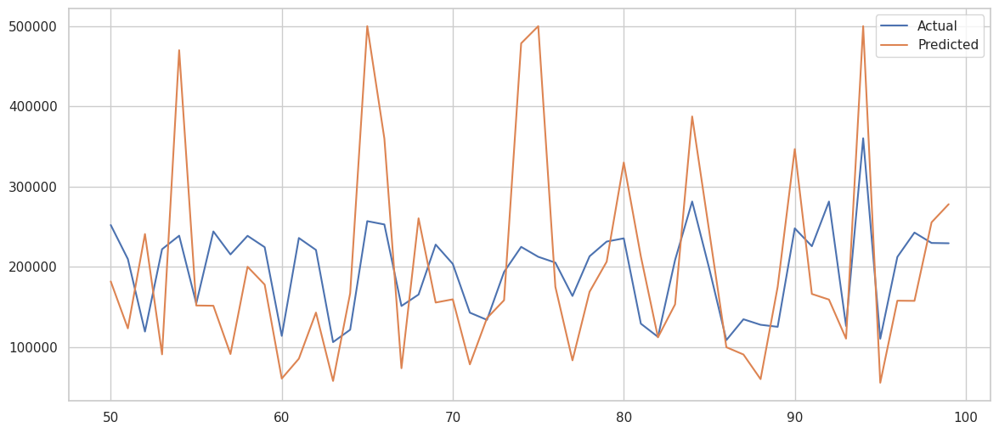

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu'),
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 52800372736.0000 - mse: 52800372736.0000 - mae: 201534.6250 - val_loss: 51615367168.0000 - val_mse: 51615367168.0000 - val_mae: 199982.8281
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 52733849600.0000 - mse: 52733849600.0000 - mae: 201373.9375 - val_loss: 51549741056.0000 - val_mse: 51549741056.0000 - val_mae: 199822.7031
Epoch 3/100
438/438 [==============================] - 1s 2ms/step - loss: 52667224064.0000 - mse: 52667224064.0000 - mae: 201212.6562 - val_loss: 51484073984.0000 - val_mse: 51484073984.0000 - val_mae: 199662.3750
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 52600815616.0000 - mse: 52600815616.0000 - mae: 201052.0469 - val_loss: 51418599424.0000 - val_mse: 51418599424.0000 - val_mae: 199502.1250
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 52534312960.0000 - mse: 52534312960.0000 - mae: 200891.4375 - val

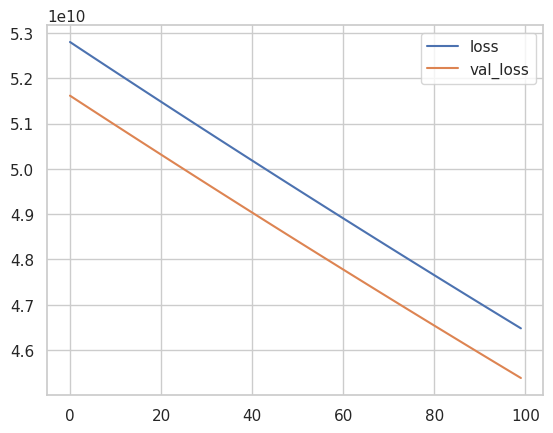

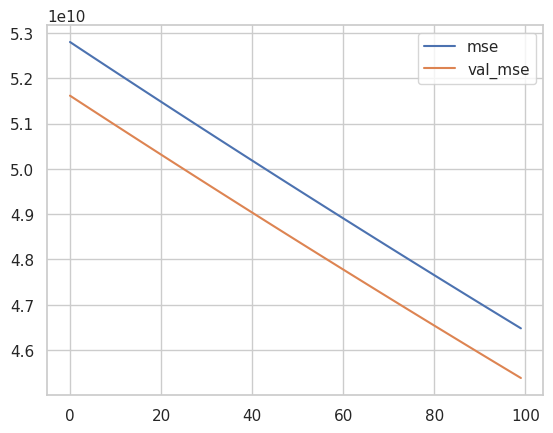

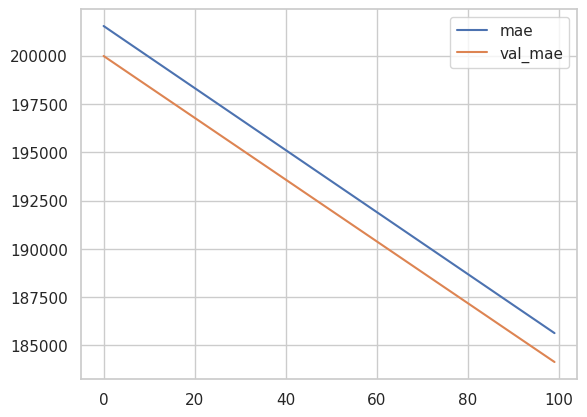

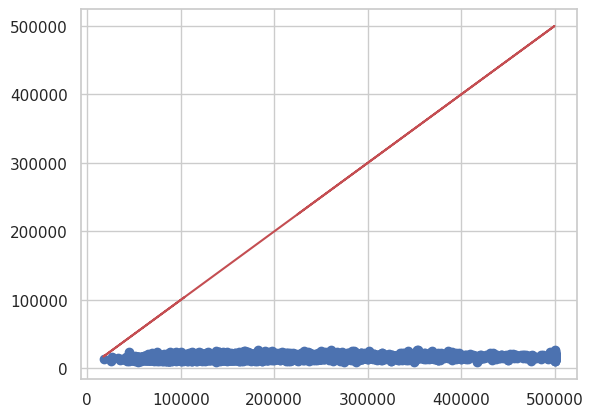

1/1 [==============================] - 0s 24ms/step


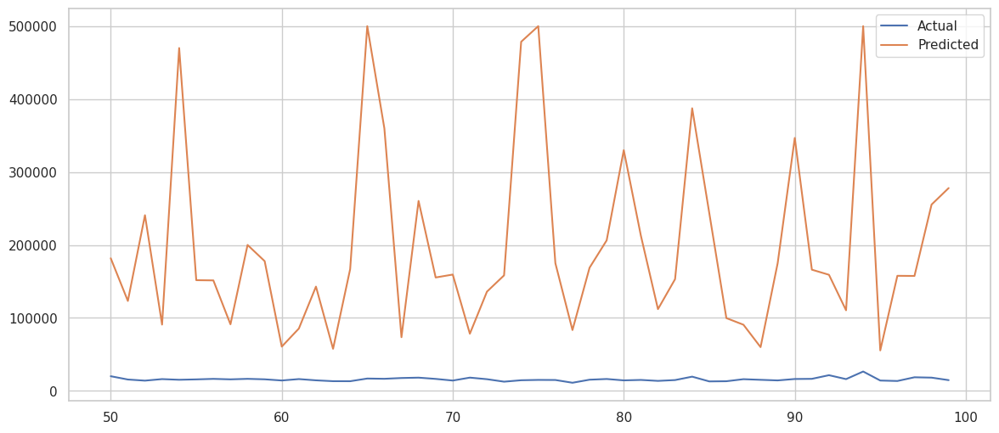

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu'),
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.1), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

DNN

Epoch 1/100
438/438 [==============================] - 2s 4ms/step - loss: 14822897664.0000 - mse: 14822897664.0000 - mae: 88105.2812 - val_loss: 6073536000.0000 - val_mse: 6073536000.0000 - val_mae: 56876.4648
Epoch 2/100
438/438 [==============================] - 2s 4ms/step - loss: 5460802560.0000 - mse: 5460802560.0000 - mae: 54303.1250 - val_loss: 4949053952.0000 - val_mse: 4949053952.0000 - val_mae: 50967.5781
Epoch 3/100
438/438 [==============================] - 2s 5ms/step - loss: 4966799360.0000 - mse: 4966799360.0000 - mae: 51301.1211 - val_loss: 4817903616.0000 - val_mse: 4817903616.0000 - val_mae: 49024.0547
Epoch 4/100
438/438 [==============================] - 2s 5ms/step - loss: 4779259904.0000 - mse: 4779259904.0000 - mae: 50095.6758 - val_loss: 4574913024.0000 - val_mse: 4574913024.0000 - val_mae: 49746.6758
Epoch 5/100
438/438 [==============================] - 2s 5ms/step - loss: 4649462784.0000 - mse: 4649462784.0000 - mae: 49200.5195 - val_loss: 4494158848.0000 - 

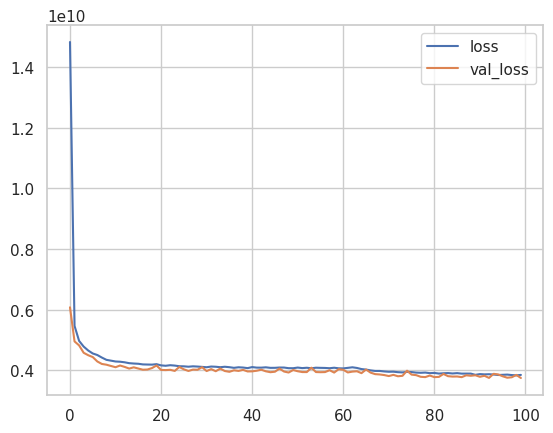

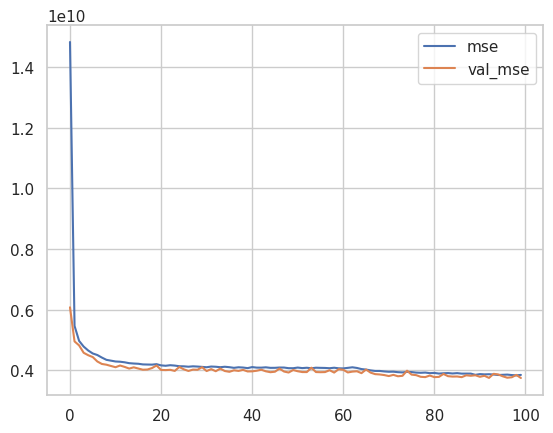

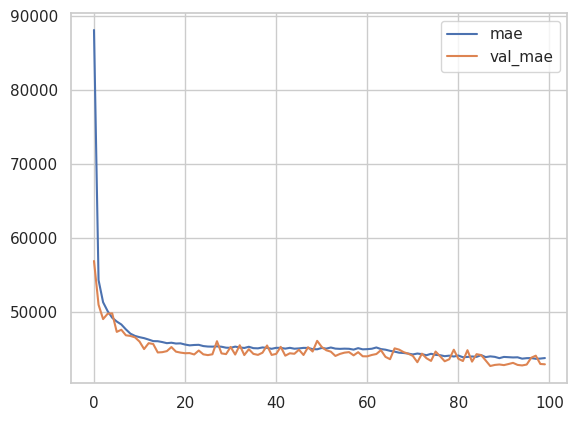

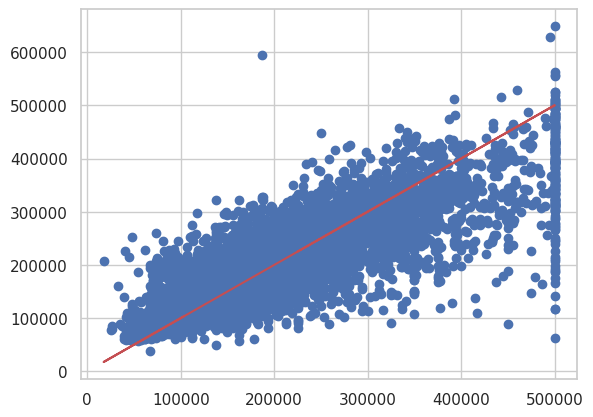

1/1 [==============================] - 0s 21ms/step


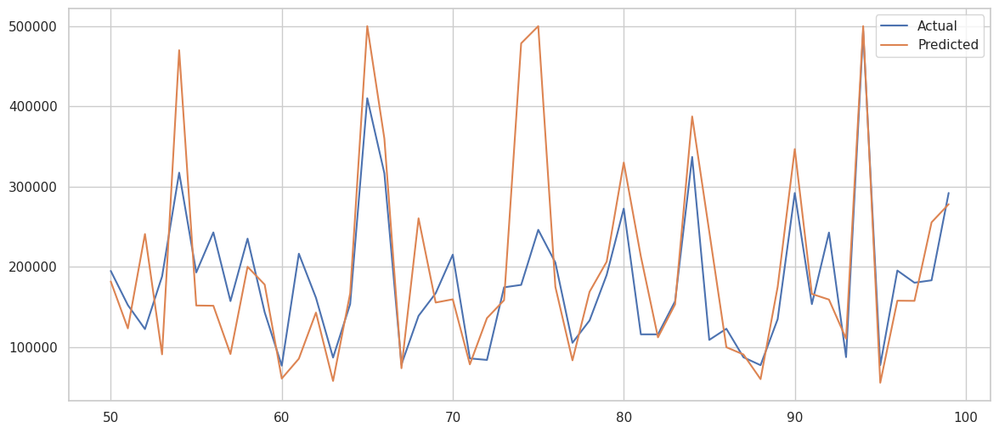

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(100,activation='relu') ,
    Dense(50,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 6992750080.0000 - mse: 6992750080.0000 - mae: 59147.4219 - val_loss: 4575419392.0000 - val_mse: 4575419392.0000 - val_mae: 48343.5117
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 4813884416.0000 - mse: 4813884416.0000 - mae: 49937.6836 - val_loss: 4275645184.0000 - val_mse: 4275645184.0000 - val_mae: 47168.7031
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 4557504000.0000 - mse: 4557504000.0000 - mae: 48133.8633 - val_loss: 4070882560.0000 - val_mse: 4070882560.0000 - val_mae: 45818.4062
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 4443490816.0000 - mse: 4443490816.0000 - mae: 47369.3047 - val_loss: 4491043328.0000 - val_mse: 4491043328.0000 - val_mae: 50217.4219
Epoch 5/100
438/438 [==============================] - 2s 5ms/step - loss: 4392556032.0000 - mse: 4392556032.0000 - mae: 47213.1641 - val_loss: 4539257856.0000 - va

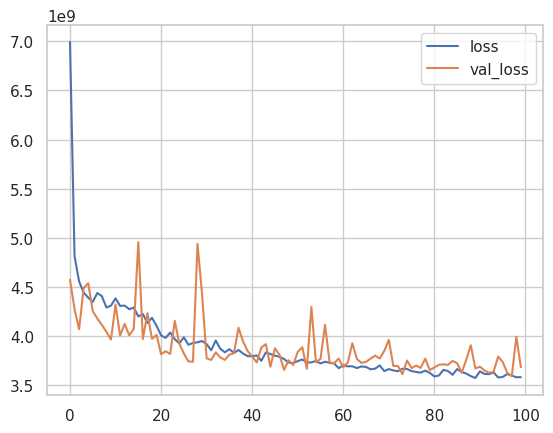

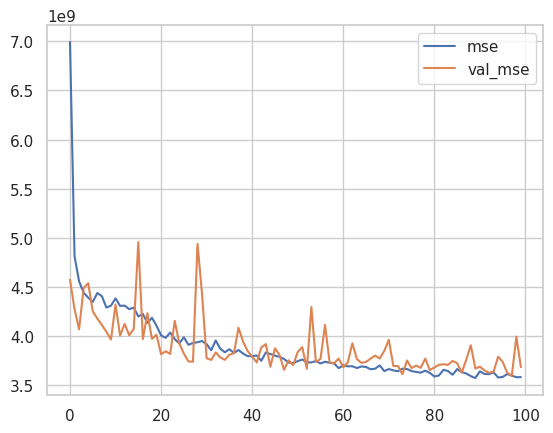

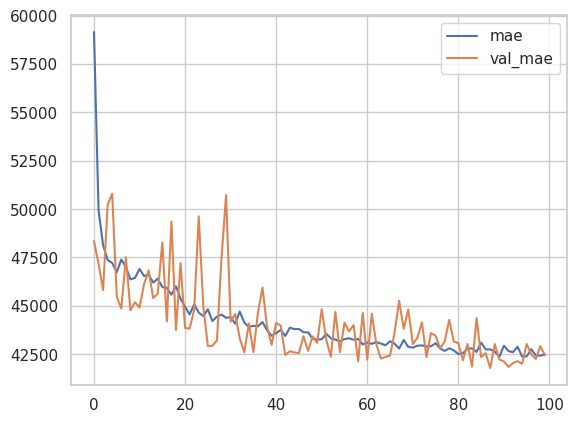

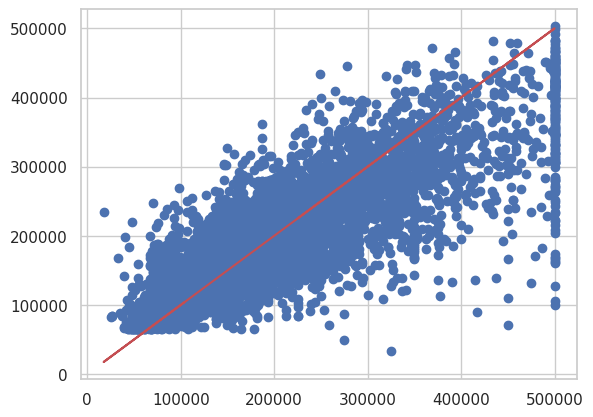

1/1 [==============================] - 0s 57ms/step


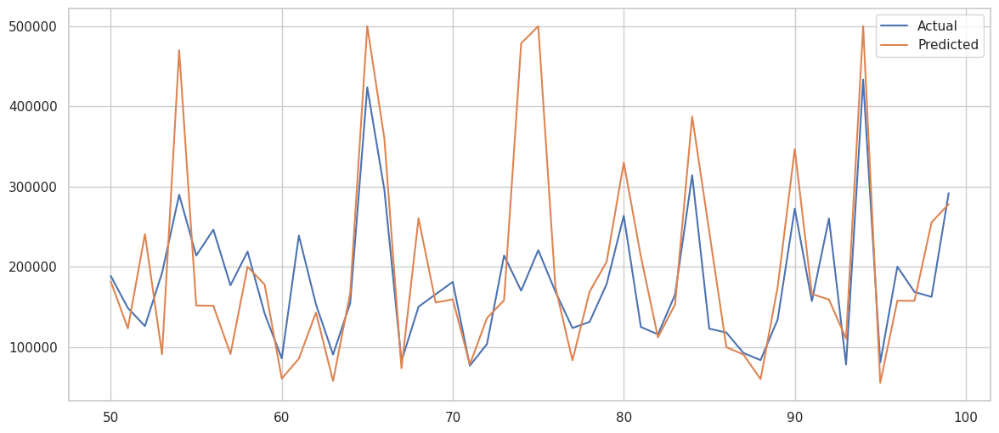

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(100,activation='relu') ,
    Dense(50,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.Adam(learning_rate=0.1), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

**SGD Optimizer **

MLP

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 54784536576.0000 - mse: 54784536576.0000 - mae: 148832.6719 - val_loss: 18907179008.0000 - val_mse: 18907179008.0000 - val_mae: 99685.1250
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 15750529024.0000 - mse: 15750529024.0000 - mae: 90562.8125 - val_loss: 12811797504.0000 - val_mse: 12811797504.0000 - val_mae: 83043.3906
Epoch 3/100
438/438 [==============================] - 2s 4ms/step - loss: 12797245440.0000 - mse: 12797245440.0000 - mae: 84954.5234 - val_loss: 11807230976.0000 - val_mse: 11807230976.0000 - val_mae: 83000.3281
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 12292648960.0000 - mse: 12292648960.0000 - mae: 85676.9922 - val_loss: 11644837888.0000 - val_mse: 11644837888.0000 - val_mae: 84069.5938
Epoch 5/100
438/438 [==============================] - 2s 5ms/step - loss: 12202064896.0000 - mse: 12202064896.0000 - mae: 86462.2422 - val_loss: 1

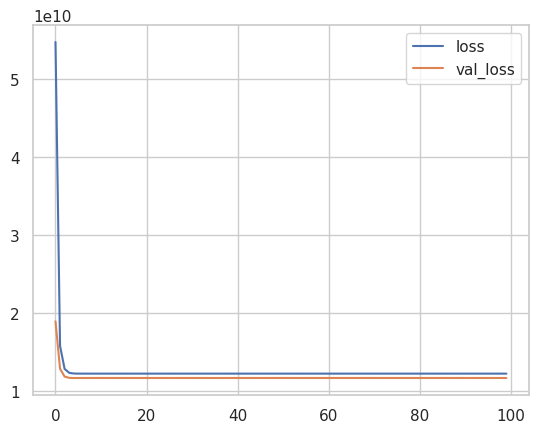

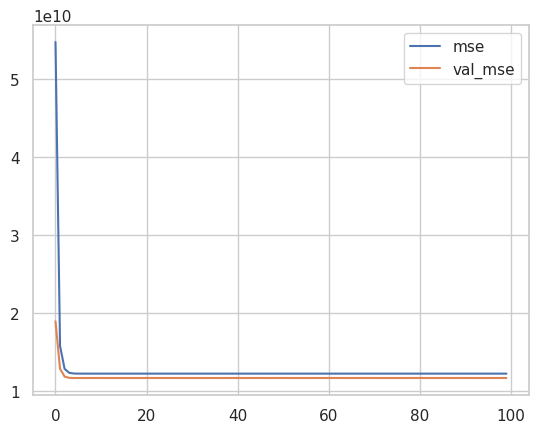

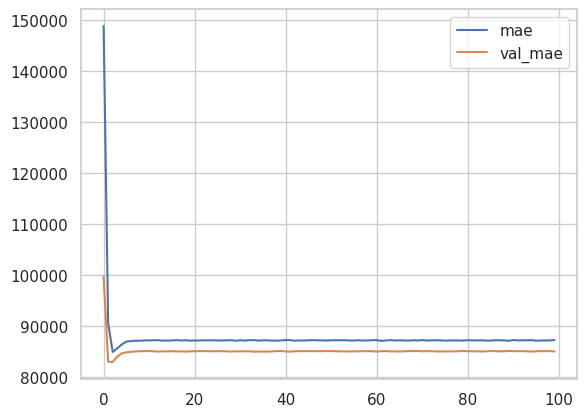

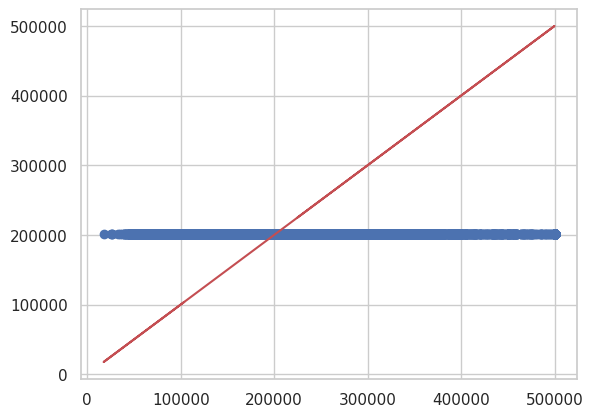

1/1 [==============================] - 0s 21ms/step


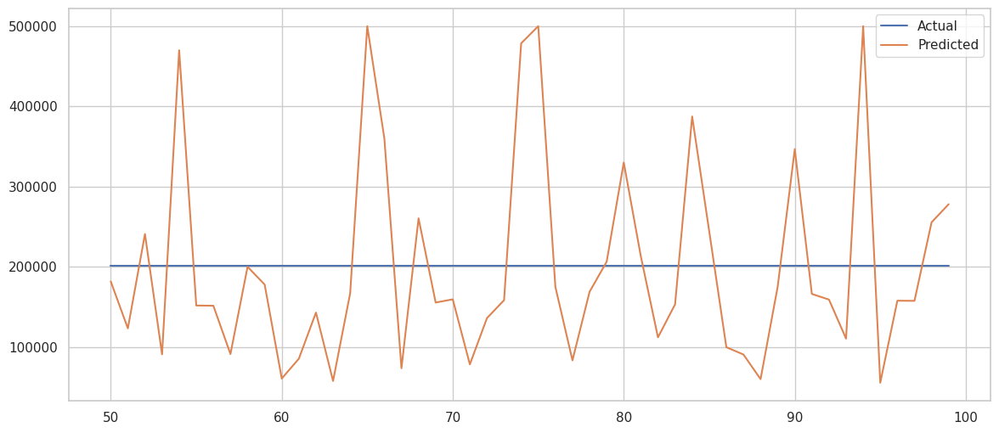

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.SGD(learning_rate=0.001), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 3s 5ms/step - loss: 5537113713934336.0000 - mse: 5537113713934336.0000 - mae: 7026506.0000 - val_loss: 11652782080.0000 - val_mse: 11652782080.0000 - val_mae: 83949.6562
Epoch 2/100
438/438 [==============================] - 2s 5ms/step - loss: 12193471488.0000 - mse: 12193471488.0000 - mae: 87093.0781 - val_loss: 11640709120.0000 - val_mse: 11640709120.0000 - val_mae: 85626.9141
Epoch 3/100
438/438 [==============================] - 2s 5ms/step - loss: 12189718528.0000 - mse: 12189718528.0000 - mae: 87345.5156 - val_loss: 11623837696.0000 - val_mse: 11623837696.0000 - val_mae: 84856.1172
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 12190425088.0000 - mse: 12190425088.0000 - mae: 87177.0781 - val_loss: 11651010560.0000 - val_mse: 11651010560.0000 - val_mae: 85855.3203
Epoch 5/100
438/438 [==============================] - 2s 5ms/step - loss: 12186598400.0000 - mse: 12186598400.0000 - mae: 87204.3828 - 

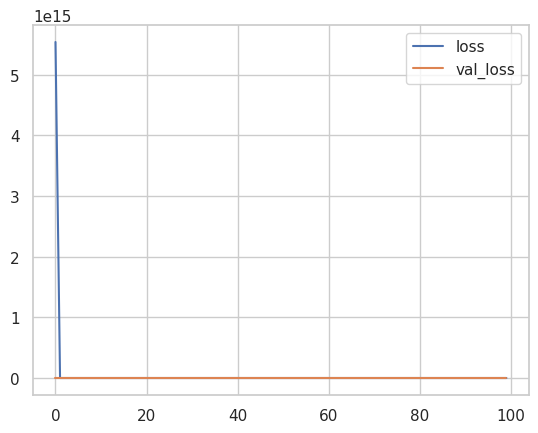

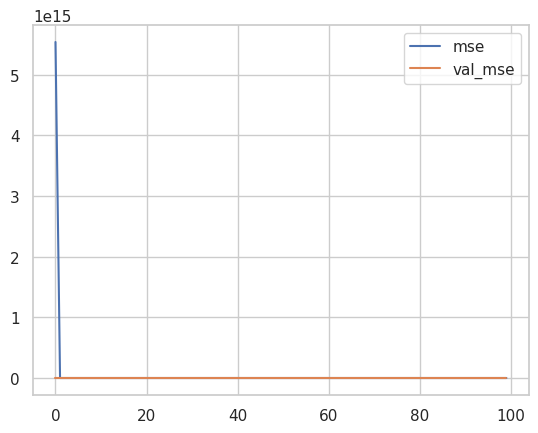

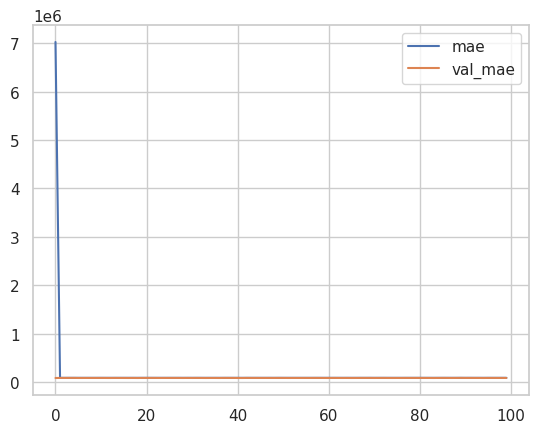

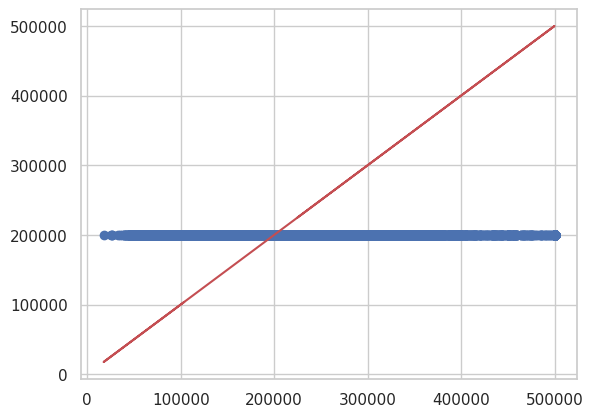

1/1 [==============================] - 0s 31ms/step


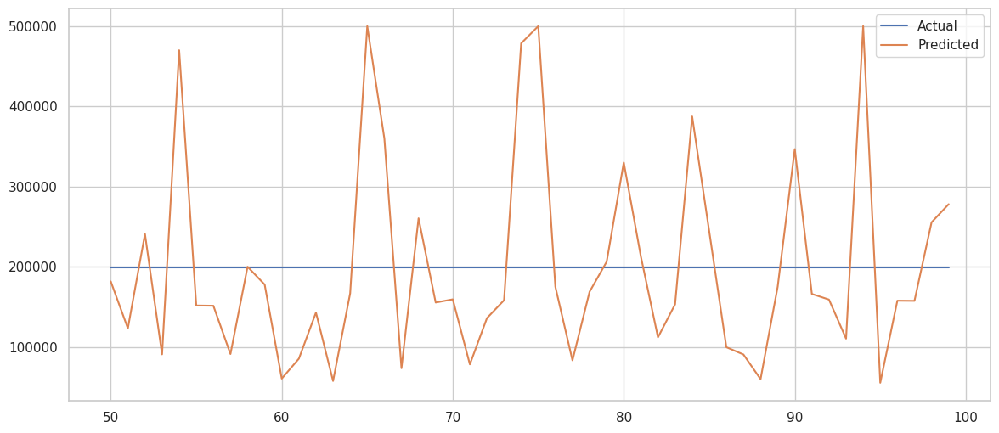

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.SGD(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Linear Regression

Epoch 1/100
438/438 [==============================] - 2s 4ms/step - loss: 22201948160.0000 - mse: 22201948160.0000 - mae: 109233.6250 - val_loss: 10819461120.0000 - val_mse: 10819461120.0000 - val_mae: 73865.7969
Epoch 2/100
438/438 [==============================] - 2s 4ms/step - loss: 9832610816.0000 - mse: 9832610816.0000 - mae: 73541.0938 - val_loss: 8896809984.0000 - val_mse: 8896809984.0000 - val_mae: 71946.2969
Epoch 3/100
438/438 [==============================] - 2s 4ms/step - loss: 8827576320.0000 - mse: 8827576320.0000 - mae: 72265.2266 - val_loss: 8387950080.0000 - val_mse: 8387950080.0000 - val_mae: 70610.4453
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 8364806144.0000 - mse: 8364806144.0000 - mae: 70438.1250 - val_loss: 8030265856.0000 - val_mse: 8030265856.0000 - val_mae: 69106.3750
Epoch 5/100
438/438 [==============================] - 2s 4ms/step - loss: 8021953536.0000 - mse: 8021953536.0000 - mae: 68734.3594 - val_loss: 7755428352.0000

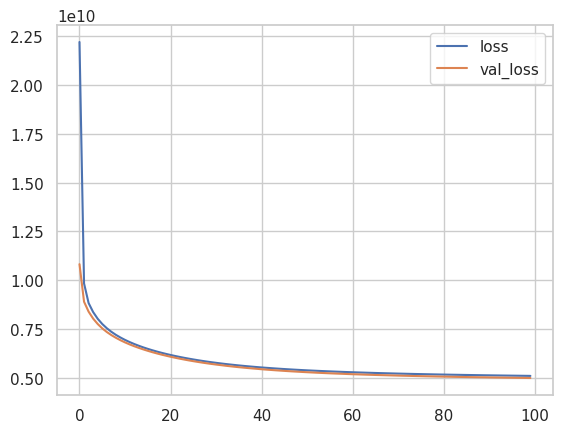

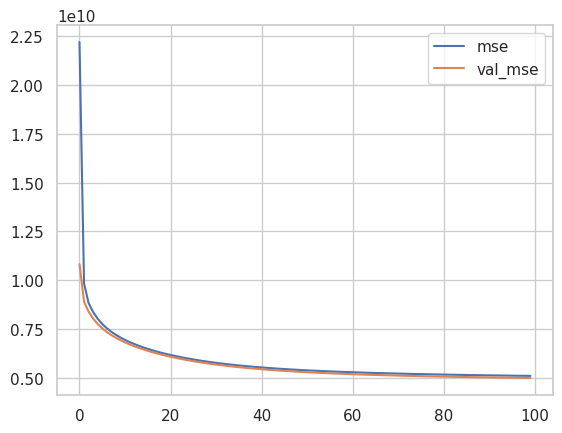

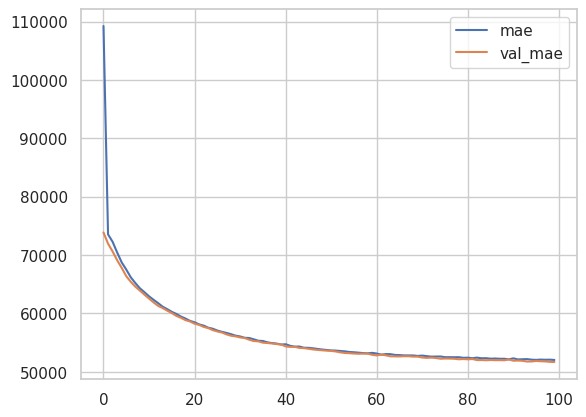

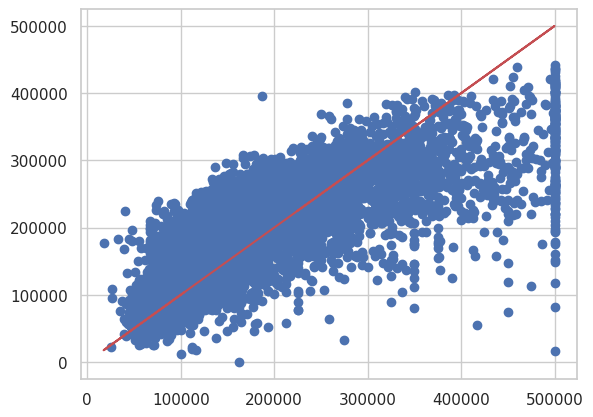

1/1 [==============================] - 0s 25ms/step


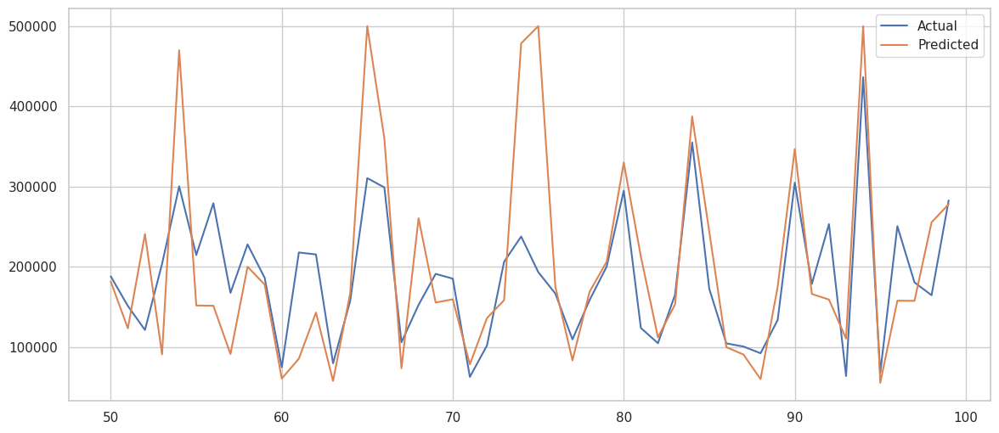

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu'),
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.SGD(learning_rate=0.001), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 4ms/step - loss: 9526628352.0000 - mse: 9526628352.0000 - mae: 72685.5078 - val_loss: 6920859136.0000 - val_mse: 6920859136.0000 - val_mae: 62425.0859
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 6551030272.0000 - mse: 6551030272.0000 - mae: 60597.0039 - val_loss: 6152955392.0000 - val_mse: 6152955392.0000 - val_mae: 59539.0430
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 5972436480.0000 - mse: 5972436480.0000 - mae: 57373.7578 - val_loss: 5710947840.0000 - val_mse: 5710947840.0000 - val_mae: 55644.4180
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 5655324160.0000 - mse: 5655324160.0000 - mae: 55335.8320 - val_loss: 5465637888.0000 - val_mse: 5465637888.0000 - val_mae: 55030.4766
Epoch 5/100
438/438 [==============================] - 1s 2ms/step - loss: 5459951104.0000 - mse: 5459951104.0000 - mae: 54139.3398 - val_loss: 5309224960.0000 - va

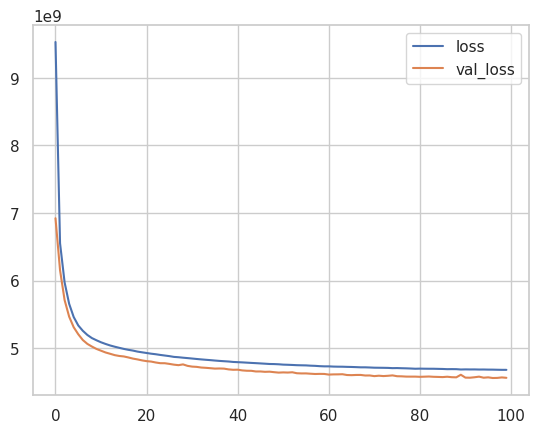

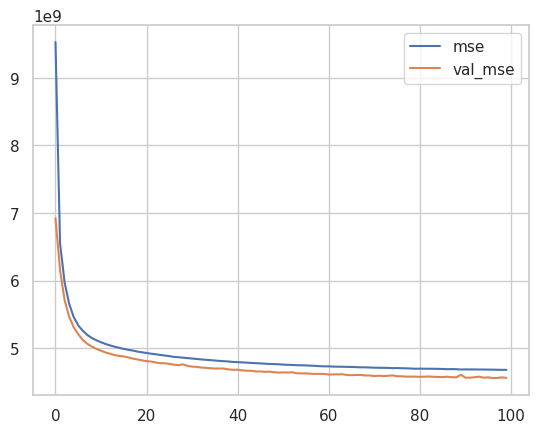

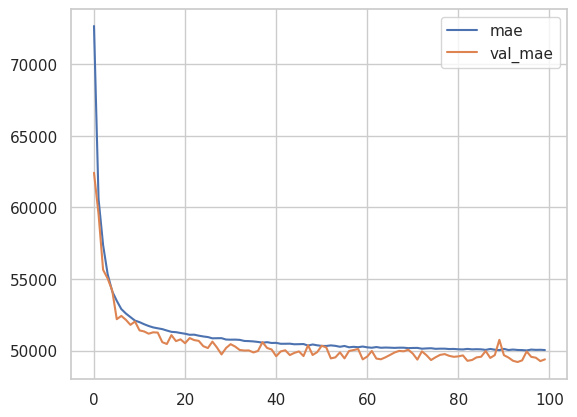

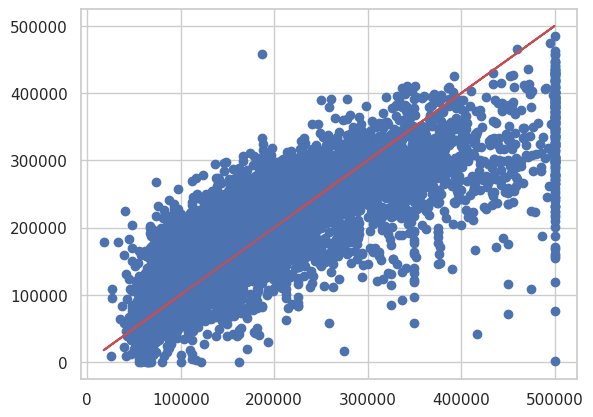

1/1 [==============================] - 0s 21ms/step


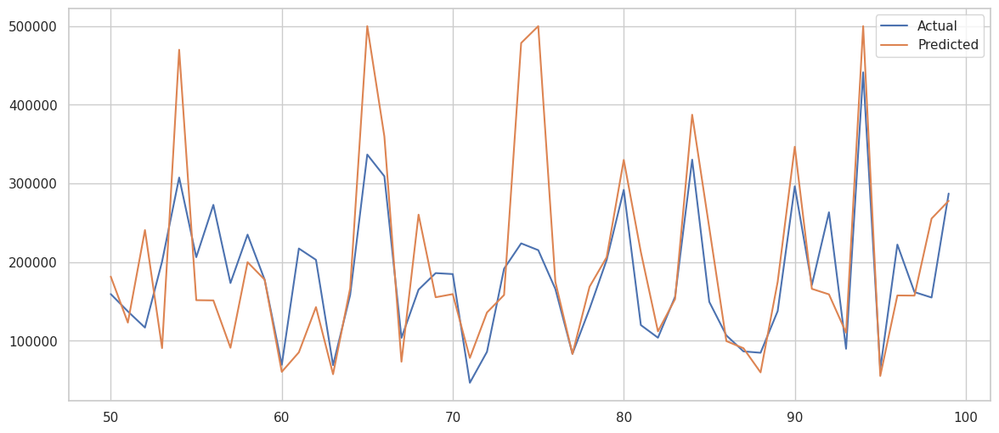

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu'),
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.SGD(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 4ms/step - loss: 6041856512.0000 - mse: 6041856512.0000 - mae: 56886.1367 - val_loss: 5392463872.0000 - val_mse: 5392463872.0000 - val_mae: 50619.6602
Epoch 2/100
438/438 [==============================] - 2s 4ms/step - loss: 5053454848.0000 - mse: 5053454848.0000 - mae: 51831.0391 - val_loss: 5303735296.0000 - val_mse: 5303735296.0000 - val_mae: 57513.7969
Epoch 3/100
438/438 [==============================] - 2s 4ms/step - loss: 4941008896.0000 - mse: 4941008896.0000 - mae: 51284.3750 - val_loss: 4743817216.0000 - val_mse: 4743817216.0000 - val_mae: 50237.8750
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 4876736000.0000 - mse: 4876736000.0000 - mae: 50946.8398 - val_loss: 5004953600.0000 - val_mse: 5004953600.0000 - val_mae: 54955.0508
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 4825713664.0000 - mse: 4825713664.0000 - mae: 50710.2070 - val_loss: 4640644608.0000 - va

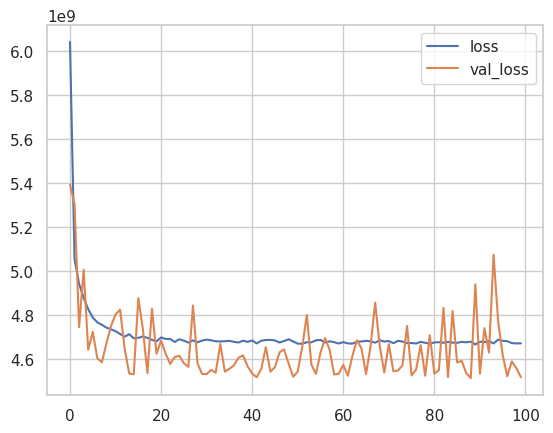

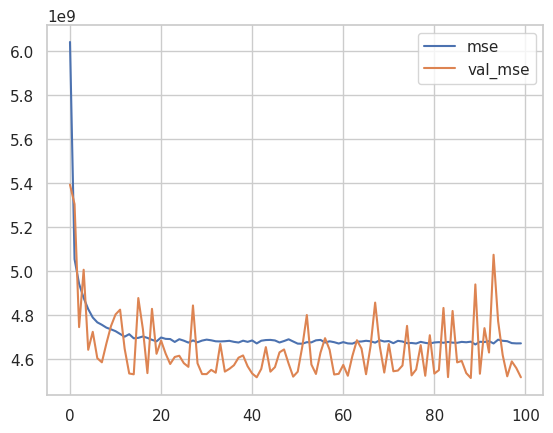

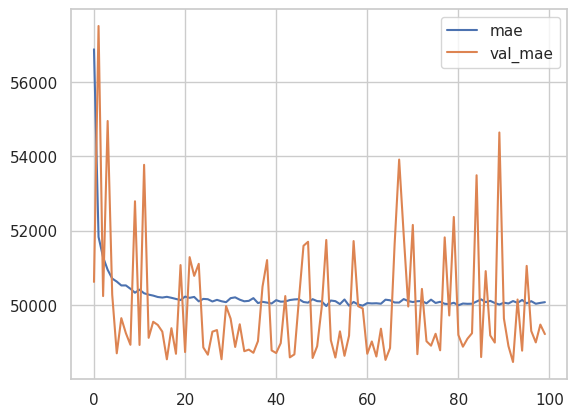

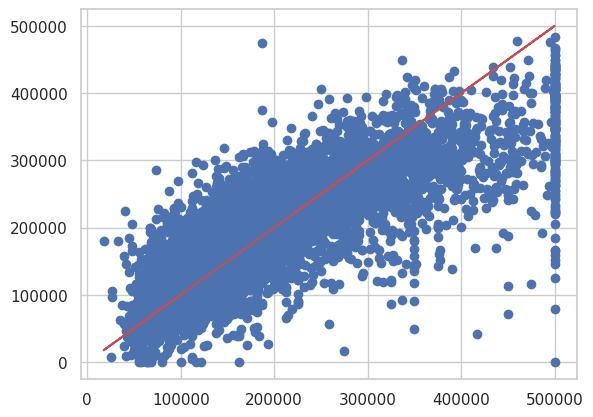

1/1 [==============================] - 0s 22ms/step


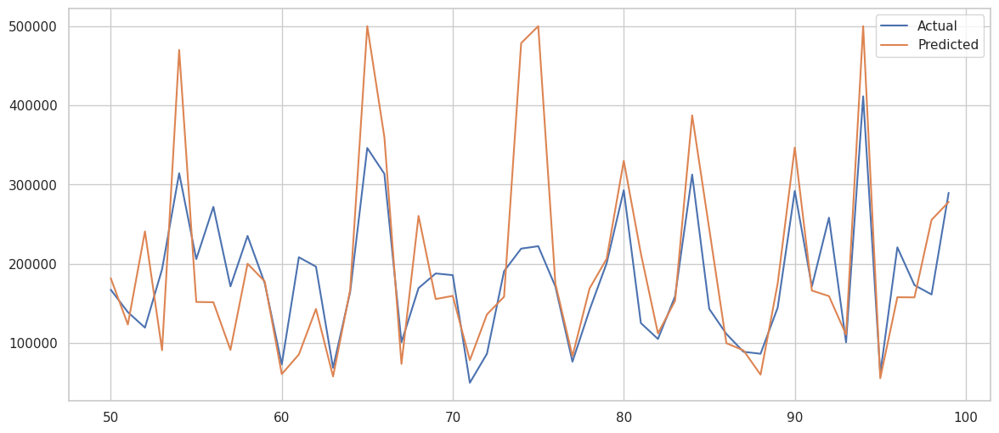

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu'),
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.SGD(learning_rate=0.1), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

DNN

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 95349596160.0000 - mse: 95349596160.0000 - mae: 156819.0156 - val_loss: 19286972416.0000 - val_mse: 19286972416.0000 - val_mae: 100868.1172
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 15933225984.0000 - mse: 15933225984.0000 - mae: 91046.7812 - val_loss: 12875646976.0000 - val_mse: 12875646976.0000 - val_mae: 83128.5703
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 12828736512.0000 - mse: 12828736512.0000 - mae: 84961.3359 - val_loss: 11817674752.0000 - val_mse: 11817674752.0000 - val_mae: 82970.0156
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 12298128384.0000 - mse: 12298128384.0000 - mae: 85647.5078 - val_loss: 11646312448.0000 - val_mse: 11646312448.0000 - val_mae: 84045.2891
Epoch 5/100
438/438 [==============================] - 2s 4ms/step - loss: 12202961920.0000 - mse: 12202961920.0000 - mae: 86445.1953 - val_loss: 

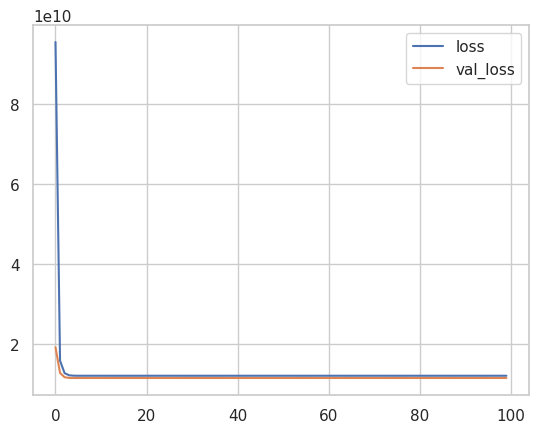

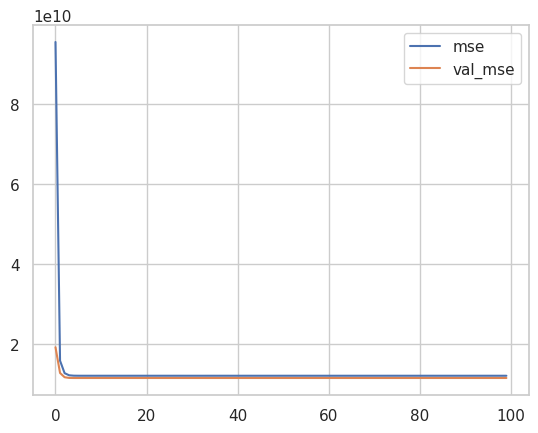

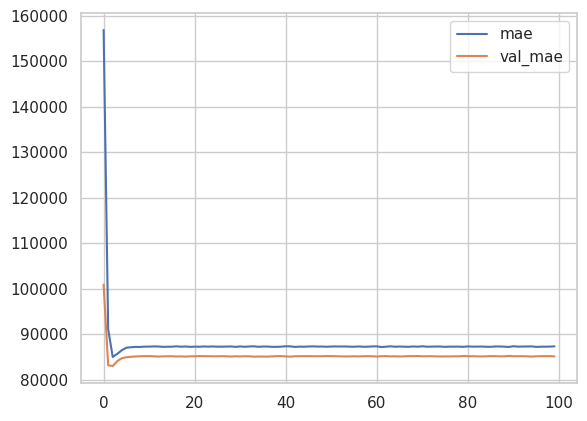

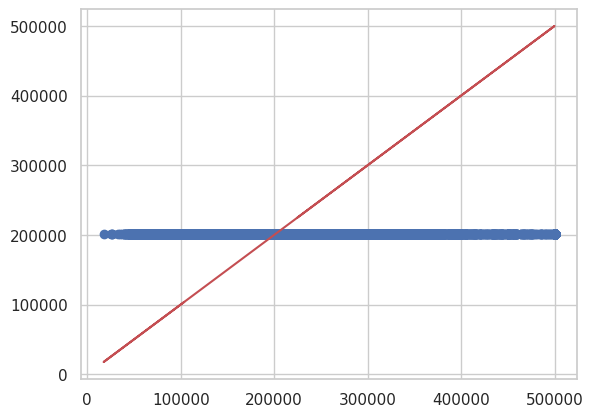

1/1 [==============================] - 0s 27ms/step


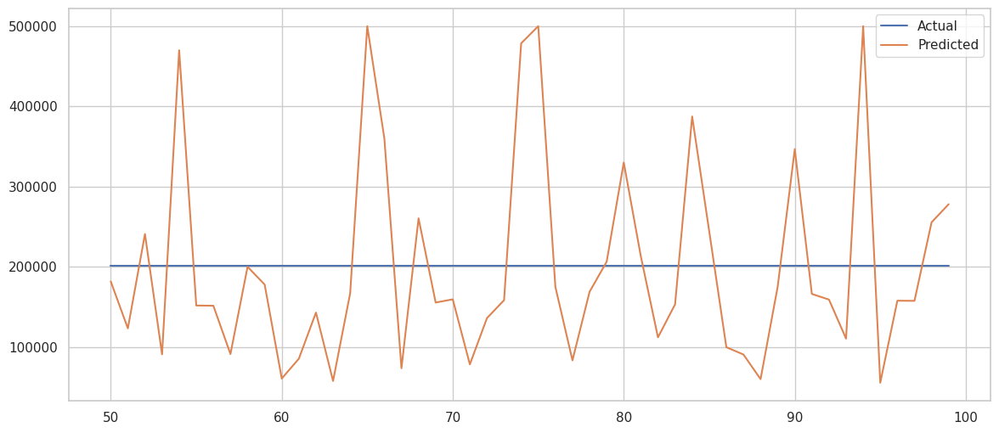

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(100,activation='relu') ,
    Dense(50,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.SGD(learning_rate=0.001), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

**RMSPROP**

MLP

Epoch 1/100
438/438 [==============================] - 3s 6ms/step - loss: 52824887296.0000 - mse: 52824887296.0000 - mae: 201593.8438 - val_loss: 51651715072.0000 - val_mse: 51651715072.0000 - val_mae: 200071.3594
Epoch 2/100
438/438 [==============================] - 2s 5ms/step - loss: 52740030464.0000 - mse: 52740030464.0000 - mae: 201388.6562 - val_loss: 51495776256.0000 - val_mse: 51495776256.0000 - val_mae: 199690.3594
Epoch 3/100
438/438 [==============================] - 2s 5ms/step - loss: 52477280256.0000 - mse: 52477280256.0000 - mae: 200750.5000 - val_loss: 51114844160.0000 - val_mse: 51114844160.0000 - val_mae: 198756.6406
Epoch 4/100
438/438 [==============================] - 2s 5ms/step - loss: 51935518720.0000 - mse: 51935518720.0000 - mae: 199433.0312 - val_loss: 50410913792.0000 - val_mse: 50410913792.0000 - val_mae: 197020.1719
Epoch 5/100
438/438 [==============================] - 2s 4ms/step - loss: 51021705216.0000 - mse: 51021705216.0000 - mae: 197195.3281 - val

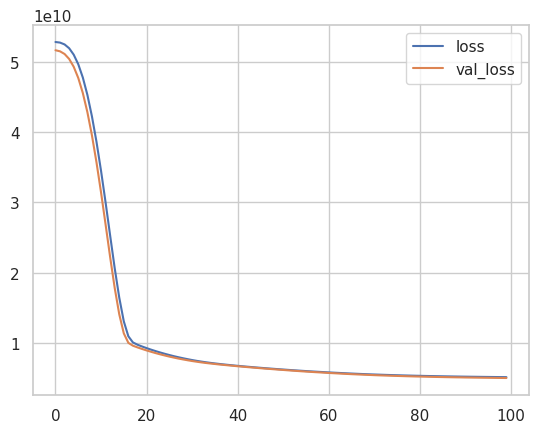

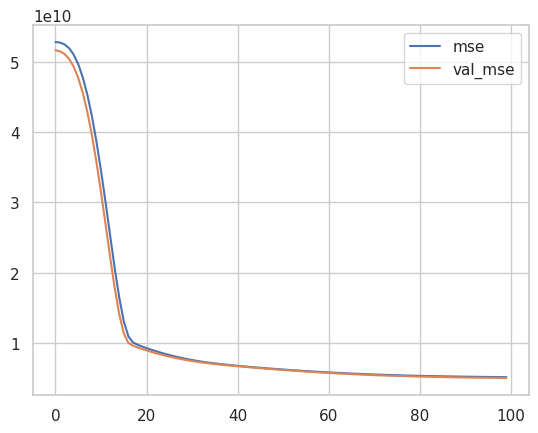

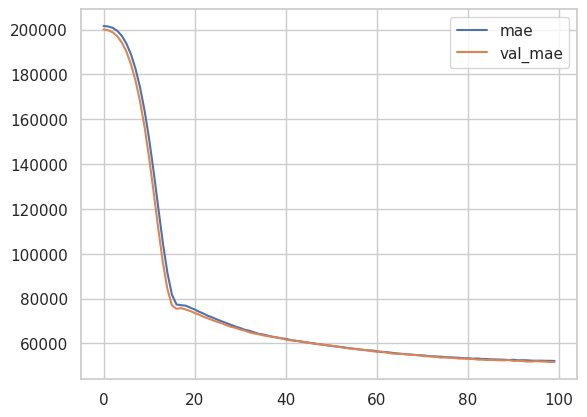

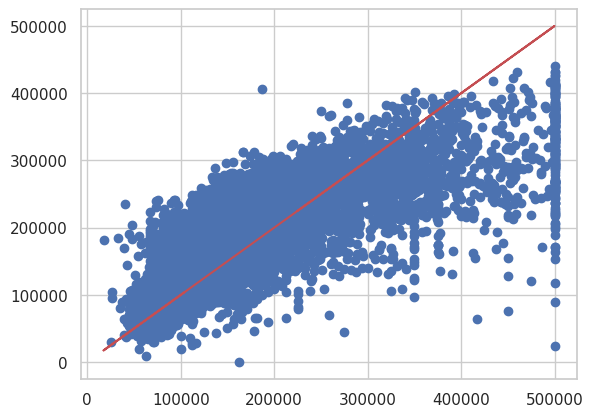

1/1 [==============================] - 0s 22ms/step


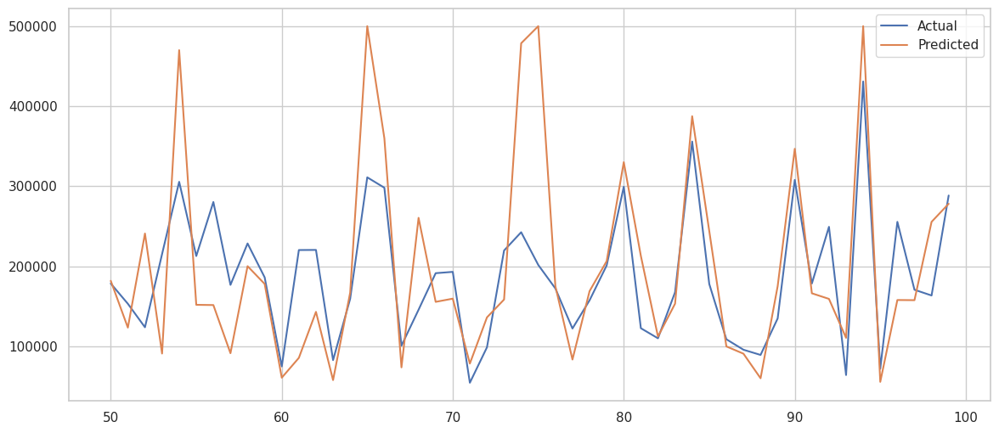

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.001), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 3s 5ms/step - loss: 47931023360.0000 - mse: 47931023360.0000 - mae: 188927.4844 - val_loss: 35055476736.0000 - val_mse: 35055476736.0000 - val_mae: 154438.0469
Epoch 2/100
438/438 [==============================] - 2s 5ms/step - loss: 18347657216.0000 - mse: 18347657216.0000 - mae: 99705.4219 - val_loss: 9242782720.0000 - val_mse: 9242782720.0000 - val_mae: 75625.3438
Epoch 3/100
438/438 [==============================] - 2s 4ms/step - loss: 8546158592.0000 - mse: 8546158592.0000 - mae: 71987.0078 - val_loss: 7665918976.0000 - val_mse: 7665918976.0000 - val_mae: 67339.9766
Epoch 4/100
438/438 [==============================] - 2s 5ms/step - loss: 7295557632.0000 - mse: 7295557632.0000 - mae: 65314.3359 - val_loss: 6872582656.0000 - val_mse: 6872582656.0000 - val_mae: 63475.2422
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 6634286080.0000 - mse: 6634286080.0000 - mae: 61416.3906 - val_loss: 6372340224.0

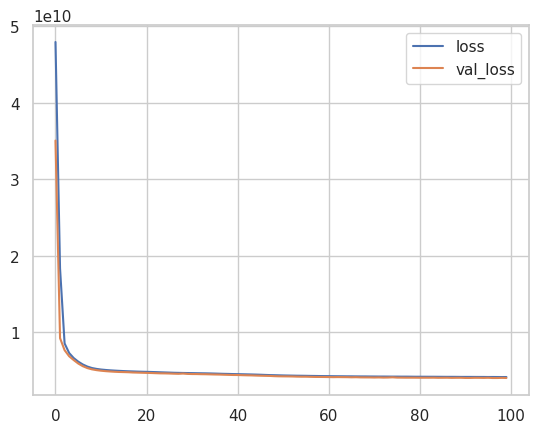

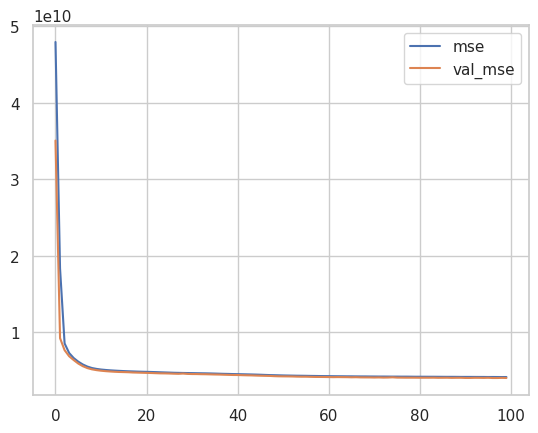

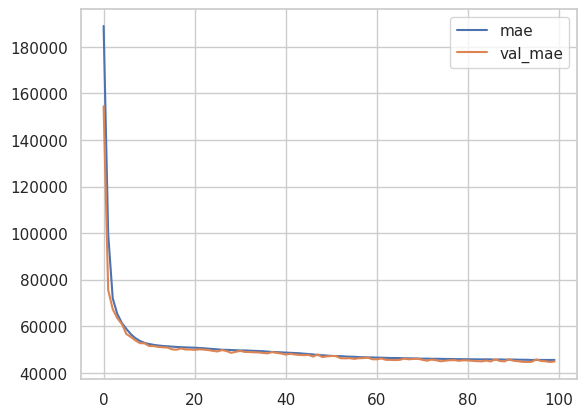

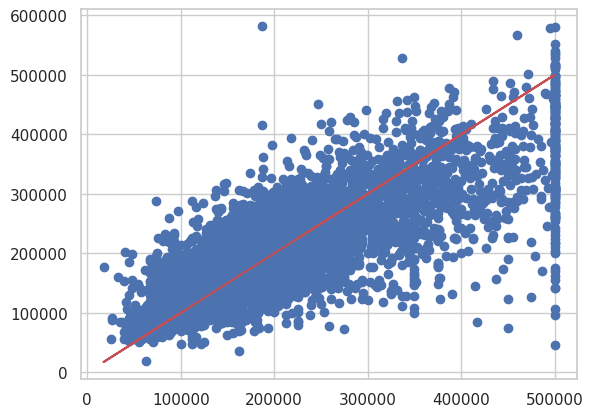

1/1 [==============================] - 0s 37ms/step


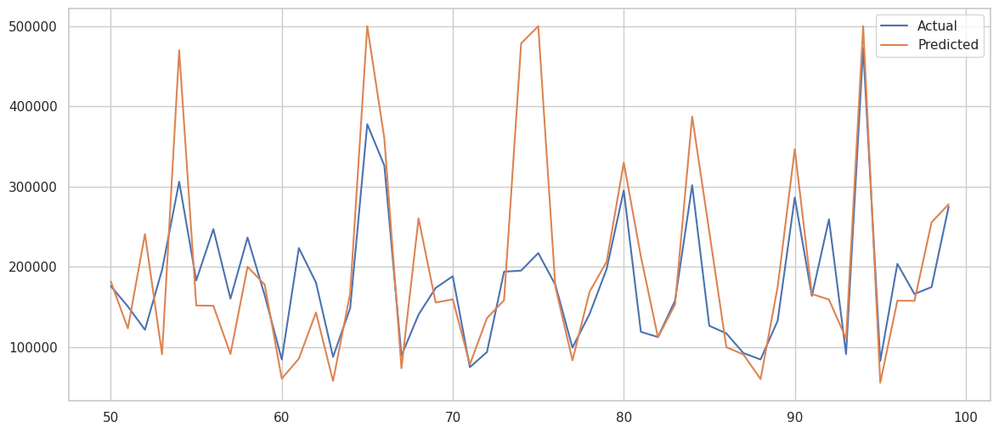

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 3s 4ms/step - loss: 10252969984.0000 - mse: 10252969984.0000 - mae: 72268.2031 - val_loss: 5613760000.0000 - val_mse: 5613760000.0000 - val_mae: 51367.6367
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 5089771008.0000 - mse: 5089771008.0000 - mae: 52017.8594 - val_loss: 5184952320.0000 - val_mse: 5184952320.0000 - val_mae: 56368.7539
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 4875982336.0000 - mse: 4875982336.0000 - mae: 50900.6367 - val_loss: 4619864576.0000 - val_mse: 4619864576.0000 - val_mae: 49913.9180
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 4718912000.0000 - mse: 4718912000.0000 - mae: 49782.0547 - val_loss: 4871065600.0000 - val_mse: 4871065600.0000 - val_mae: 53773.2773
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 4554594816.0000 - mse: 4554594816.0000 - mae: 48638.5312 - val_loss: 4304281600.0000 - 

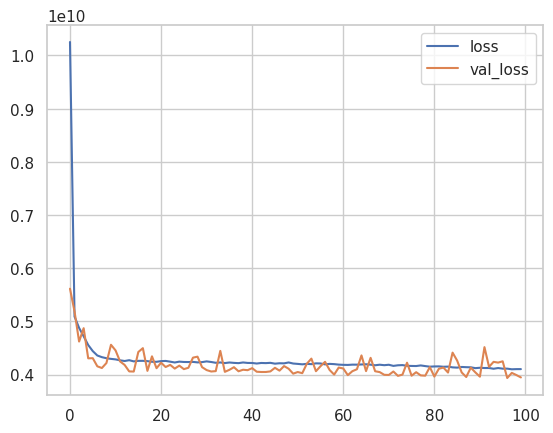

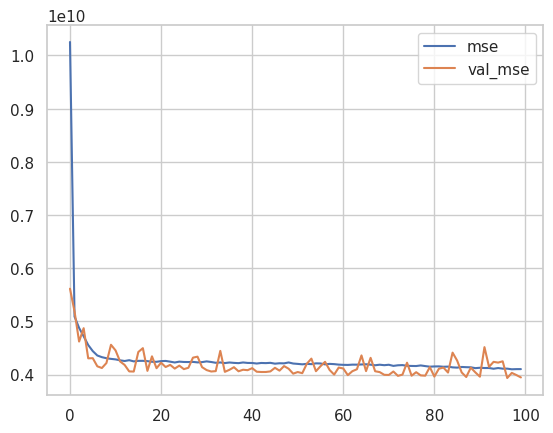

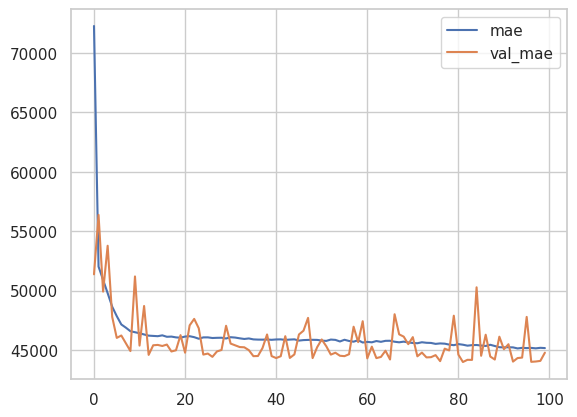

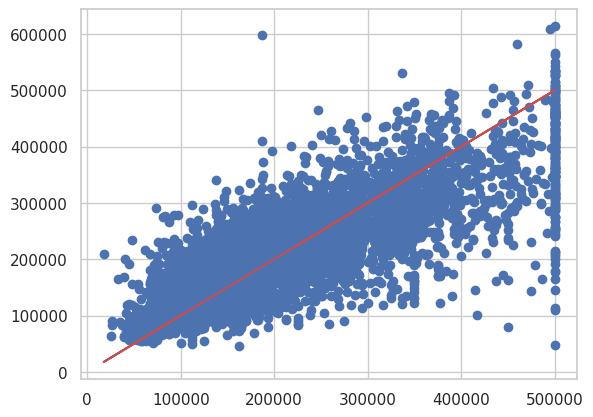

1/1 [==============================] - 0s 20ms/step


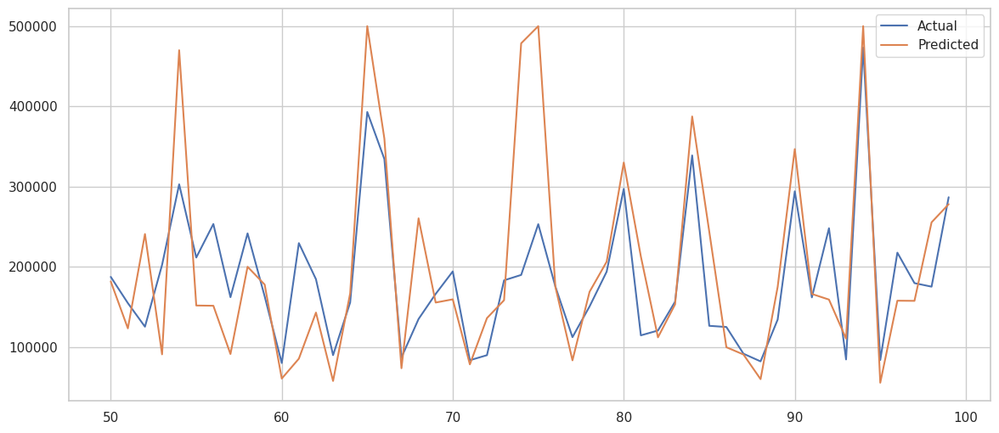

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(30,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.(learning_rate=0.1), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

LINEAR

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 52830040064.0000 - mse: 52830040064.0000 - mae: 201606.1875 - val_loss: 51665813504.0000 - val_mse: 51665813504.0000 - val_mae: 200105.9375
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 52753997824.0000 - mse: 52753997824.0000 - mae: 201422.8281 - val_loss: 51488034816.0000 - val_mse: 51488034816.0000 - val_mae: 199672.0625
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 52352561152.0000 - mse: 52352561152.0000 - mae: 200447.6406 - val_loss: 50793705472.0000 - val_mse: 50793705472.0000 - val_mae: 197968.5469
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 51164839936.0000 - mse: 51164839936.0000 - mae: 197543.6719 - val_loss: 49039208448.0000 - val_mse: 49039208448.0000 - val_mae: 193597.2500
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 48579817472.0000 - mse: 48579817472.0000 - mae: 191081.3594 - val

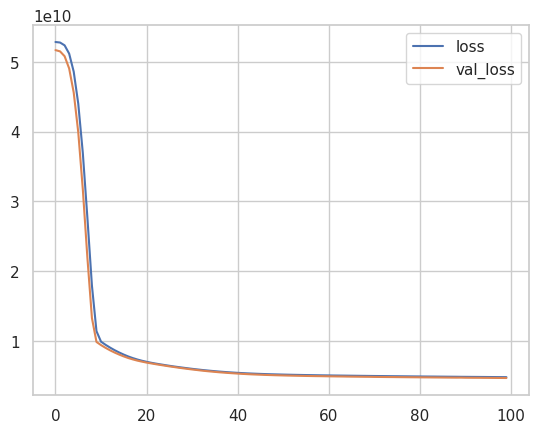

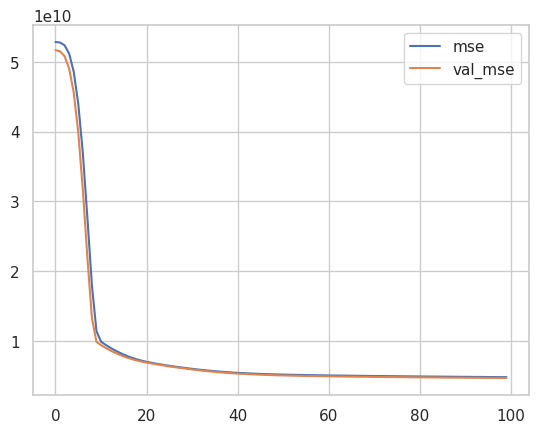

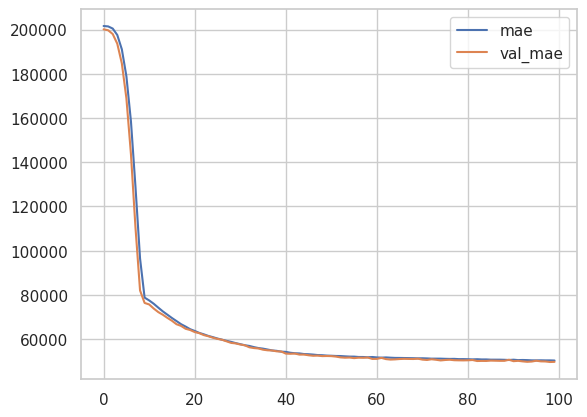

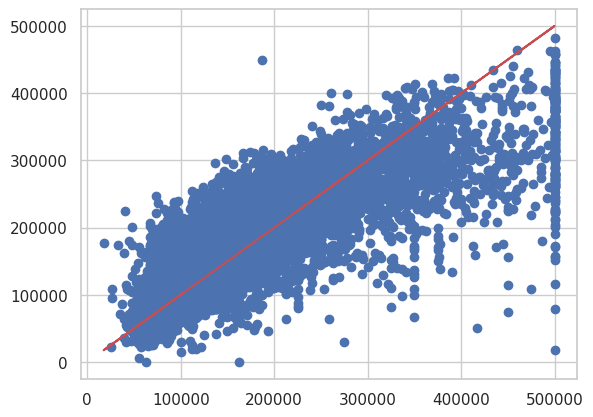

1/1 [==============================] - 0s 26ms/step


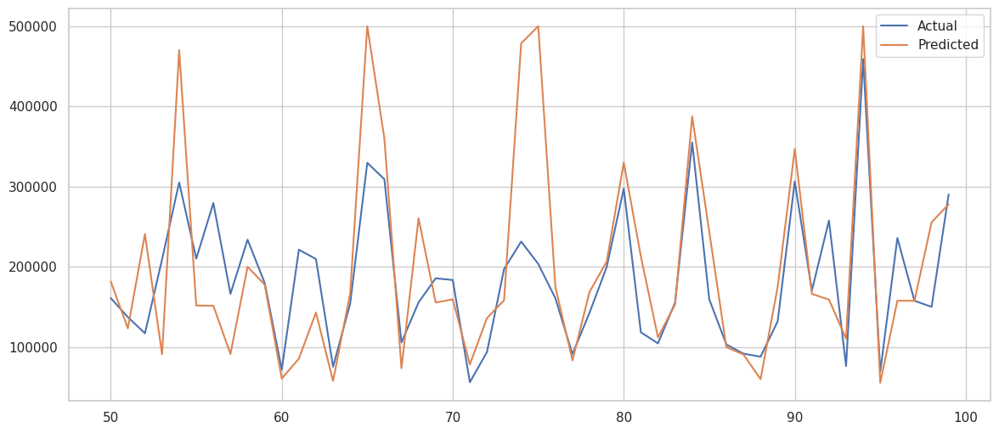

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    tf.keras.layers.Dense(30,activation='relu',input_shape=[no_features_columns]),
        tf.keras.layers.Dense(10,activation='relu'),
        tf.keras.layers.Dense(5,activation='relu'),
        tf.keras.layers.Dense(1)

])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.001), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 52830220288.0000 - mse: 52830220288.0000 - mae: 201606.7031 - val_loss: 51674501120.0000 - val_mse: 51674501120.0000 - val_mae: 200127.0469
Epoch 2/100
438/438 [==============================] - 1s 2ms/step - loss: 52823572480.0000 - mse: 52823572480.0000 - mae: 201590.5625 - val_loss: 51667955712.0000 - val_mse: 51667955712.0000 - val_mae: 200111.0000
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 52816891904.0000 - mse: 52816891904.0000 - mae: 201574.5000 - val_loss: 51661361152.0000 - val_mse: 51661361152.0000 - val_mae: 200095.0156
Epoch 4/100
438/438 [==============================] - 1s 2ms/step - loss: 52810215424.0000 - mse: 52810215424.0000 - mae: 201558.4531 - val_loss: 51654803456.0000 - val_mse: 51654803456.0000 - val_mae: 200078.9688
Epoch 5/100
438/438 [==============================] - 1s 2ms/step - loss: 52803559424.0000 - mse: 52803559424.0000 - mae: 201542.3281 - val

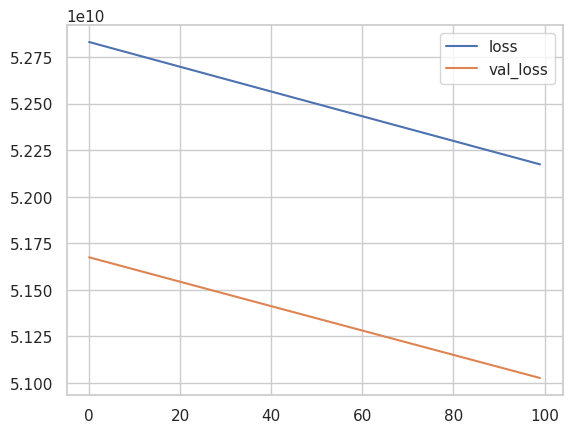

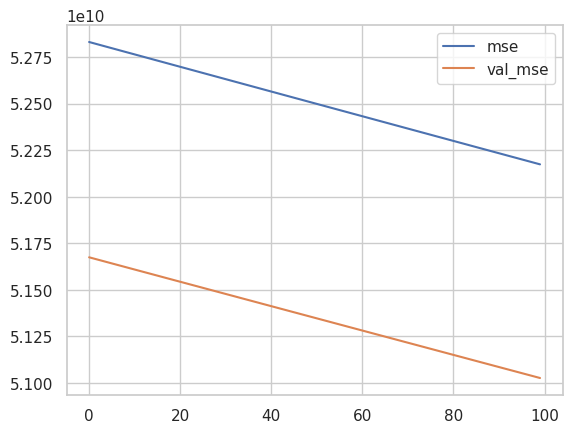

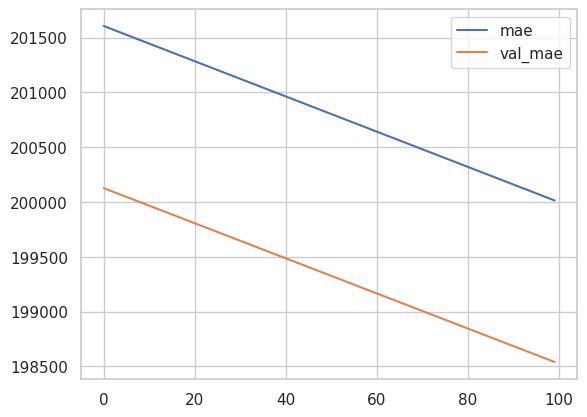

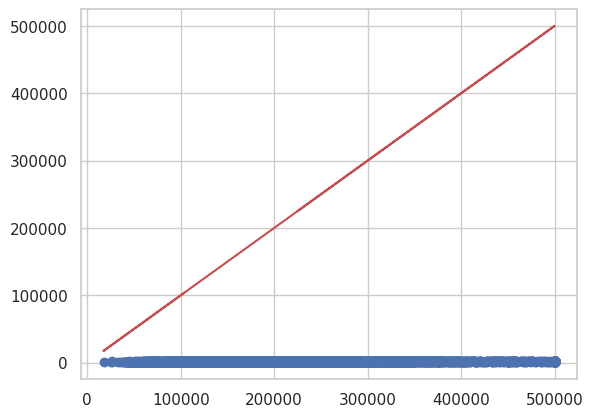

1/1 [==============================] - 0s 21ms/step


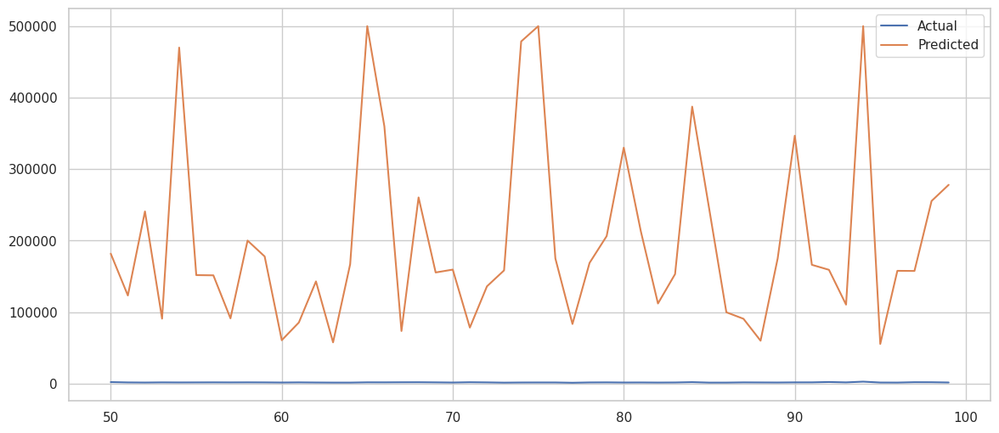

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu')  ])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 3s 5ms/step - loss: 52833603584.0000 - mse: 52833603584.0000 - mae: 201614.9531 - val_loss: 51681128448.0000 - val_mse: 51681128448.0000 - val_mae: 200143.2031
Epoch 2/100
438/438 [==============================] - 2s 4ms/step - loss: 52833595392.0000 - mse: 52833595392.0000 - mae: 201614.9062 - val_loss: 51681128448.0000 - val_mse: 51681128448.0000 - val_mae: 200143.2031
Epoch 3/100
438/438 [==============================] - 2s 4ms/step - loss: 52833570816.0000 - mse: 52833570816.0000 - mae: 201614.7969 - val_loss: 51681128448.0000 - val_mse: 51681128448.0000 - val_mae: 200143.2031
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 52833599488.0000 - mse: 52833599488.0000 - mae: 201614.8281 - val_loss: 51681128448.0000 - val_mse: 51681128448.0000 - val_mae: 200143.2031
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 52833583104.0000 - mse: 52833583104.0000 - mae: 201614.8906 - val

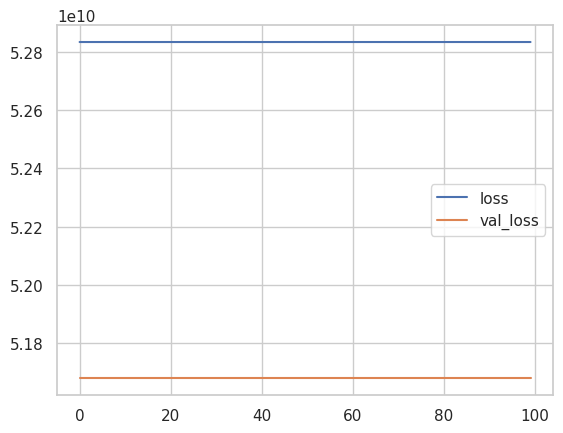

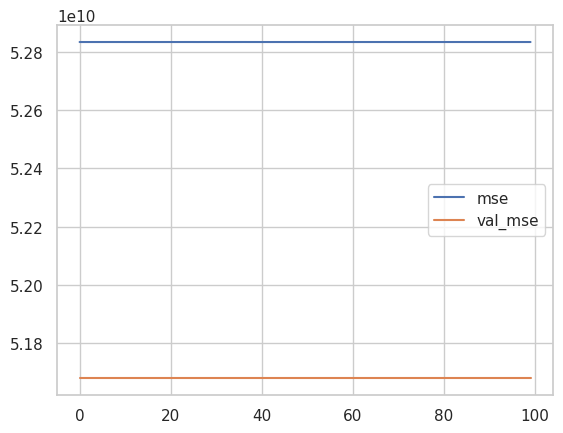

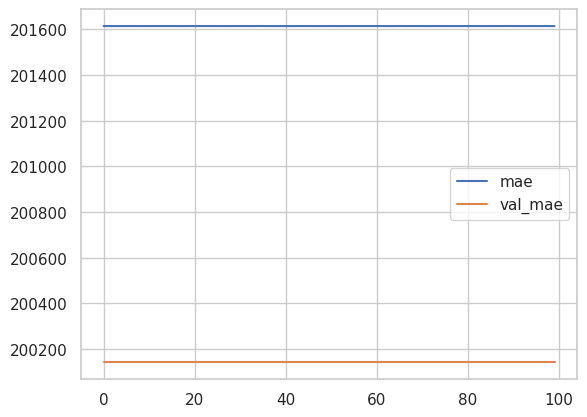

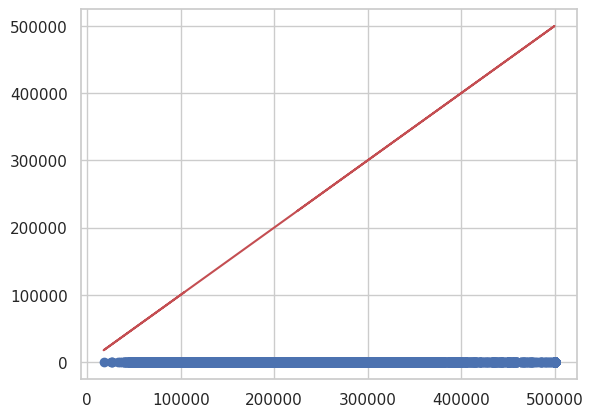

1/1 [==============================] - 0s 20ms/step


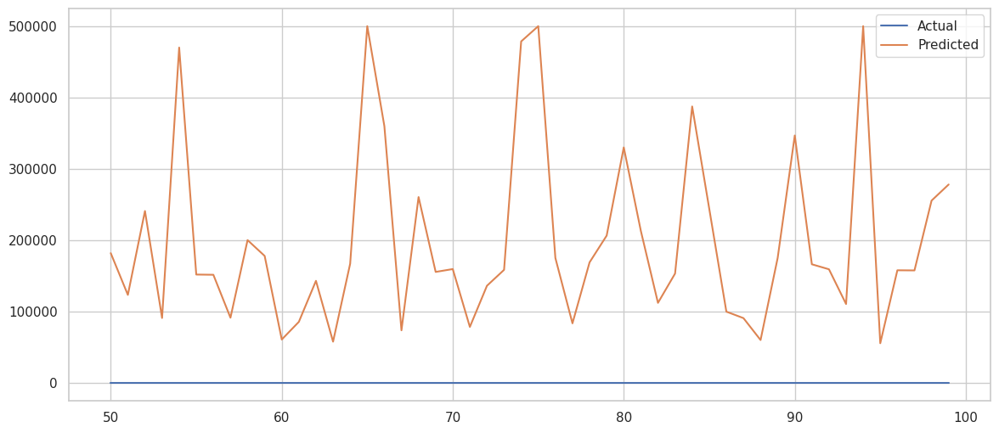

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(1,input_shape=[no_features_columns],activation='relu'),
    Dense(1,activation='relu') ,

])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.1), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

DNN

Epoch 1/100
438/438 [==============================] - 2s 4ms/step - loss: 52337041408.0000 - mse: 52337041408.0000 - mae: 200402.0156 - val_loss: 49550389248.0000 - val_mse: 49550389248.0000 - val_mae: 194870.6406
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 43250864128.0000 - mse: 43250864128.0000 - mae: 176312.0000 - val_loss: 30645135360.0000 - val_mse: 30645135360.0000 - val_mae: 140051.7500
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 17731155968.0000 - mse: 17731155968.0000 - mae: 97901.4609 - val_loss: 9643884544.0000 - val_mse: 9643884544.0000 - val_mae: 76076.6875
Epoch 4/100
438/438 [==============================] - 2s 4ms/step - loss: 9229559808.0000 - mse: 9229559808.0000 - mae: 75066.5156 - val_loss: 8411136512.0000 - val_mse: 8411136512.0000 - val_mae: 71835.9375
Epoch 5/100
438/438 [==============================] - 2s 5ms/step - loss: 8094102528.0000 - mse: 8094102528.0000 - mae: 69886.5625 - val_loss: 756120

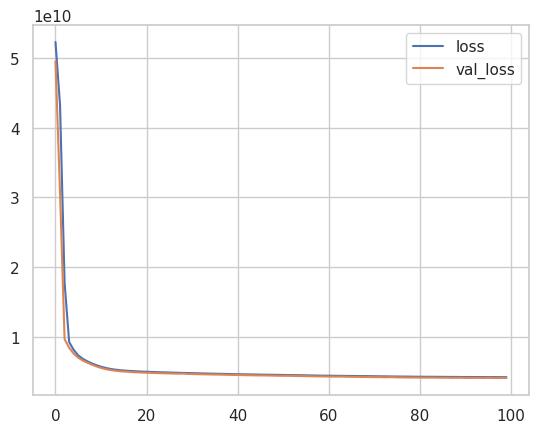

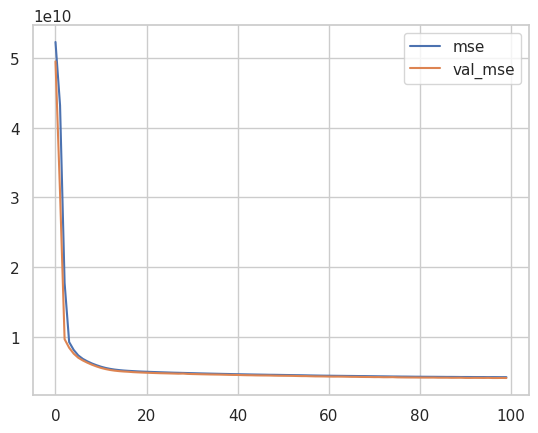

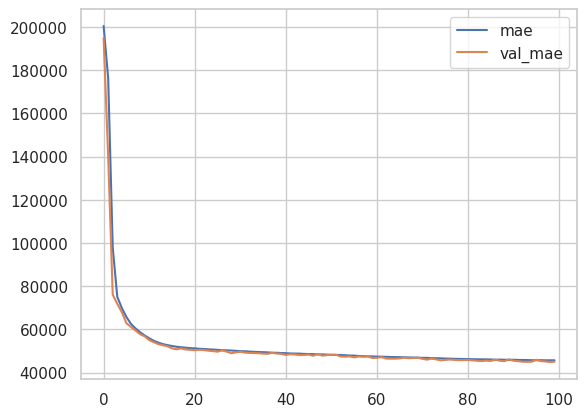

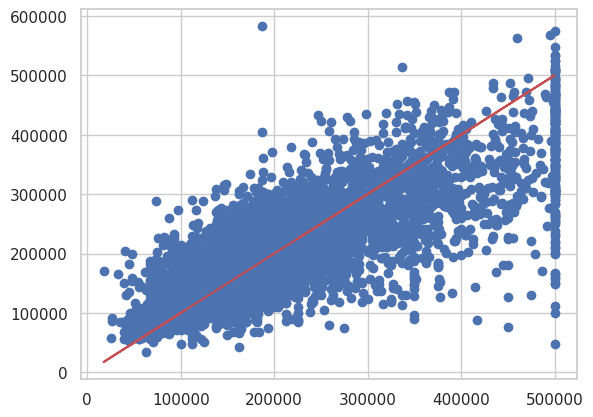

1/1 [==============================] - 0s 31ms/step


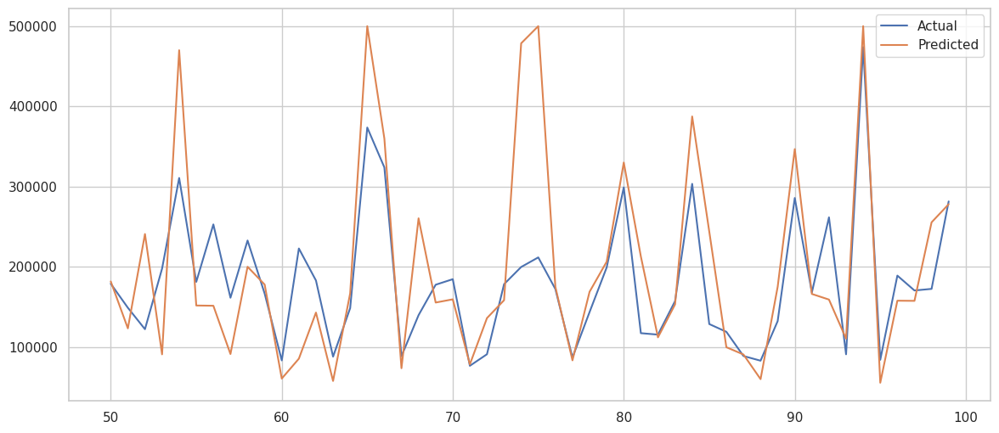

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(100,activation='relu') ,
    Dense(50,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.001), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 12661738496.0000 - mse: 12661738496.0000 - mae: 80688.3125 - val_loss: 5920218624.0000 - val_mse: 5920218624.0000 - val_mae: 53354.4570
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 5222606848.0000 - mse: 5222606848.0000 - mae: 52745.2773 - val_loss: 5220412928.0000 - val_mse: 5220412928.0000 - val_mae: 56367.0898
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 4915562496.0000 - mse: 4915562496.0000 - mae: 50877.8516 - val_loss: 4672052736.0000 - val_mse: 4672052736.0000 - val_mae: 50032.7617
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 4784855040.0000 - mse: 4784855040.0000 - mae: 50082.5625 - val_loss: 4889142272.0000 - val_mse: 4889142272.0000 - val_mae: 53633.1758
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 4680684032.0000 - mse: 4680684032.0000 - mae: 49505.1328 - val_loss: 4459686400.0000 - 

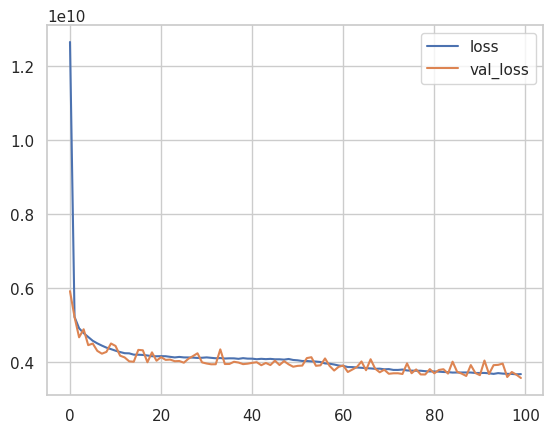

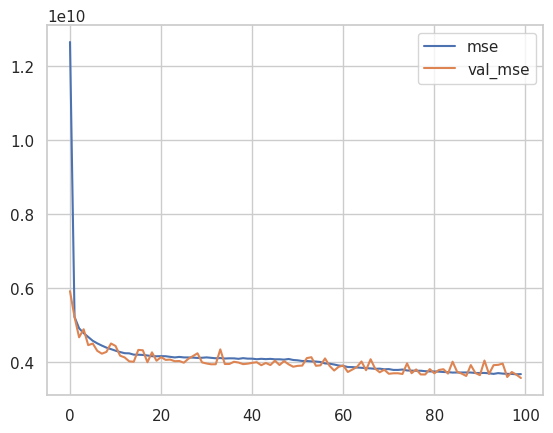

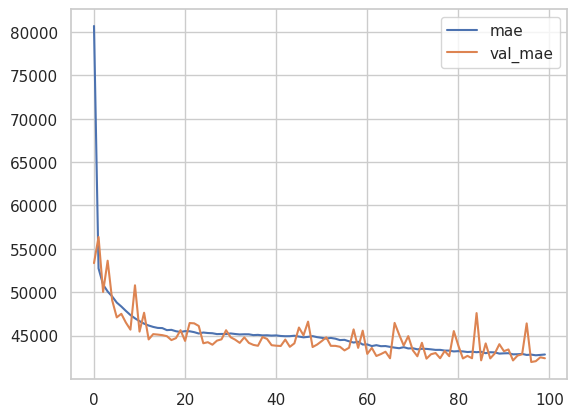

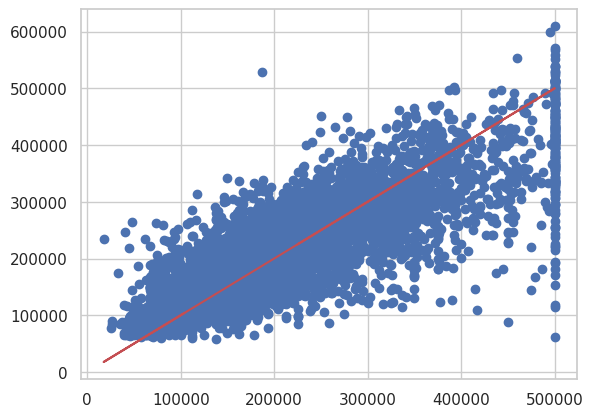

1/1 [==============================] - 0s 31ms/step


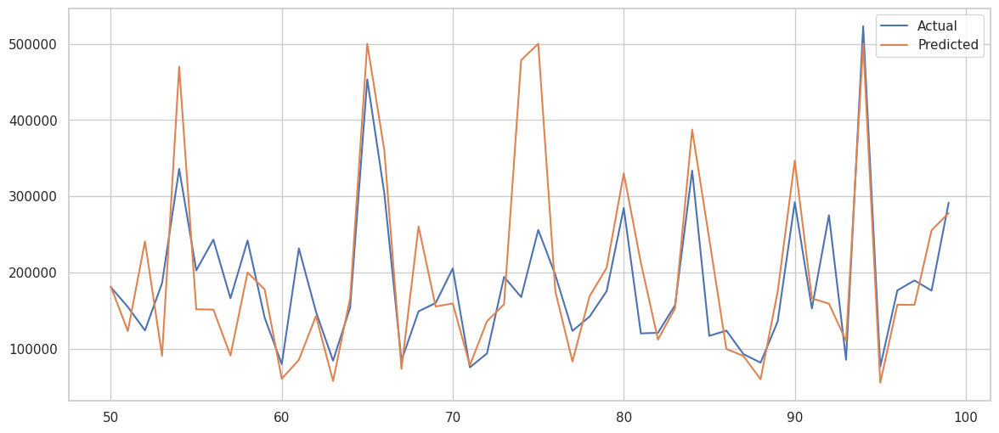

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(100,activation='relu') ,
    Dense(50,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.01), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()

Epoch 1/100
438/438 [==============================] - 2s 3ms/step - loss: 6605663744.0000 - mse: 6605663744.0000 - mae: 59042.6562 - val_loss: 7219241984.0000 - val_mse: 7219241984.0000 - val_mae: 58345.3750
Epoch 2/100
438/438 [==============================] - 1s 3ms/step - loss: 5351419904.0000 - mse: 5351419904.0000 - mae: 53016.8203 - val_loss: 12950084608.0000 - val_mse: 12950084608.0000 - val_mae: 97924.5234
Epoch 3/100
438/438 [==============================] - 1s 3ms/step - loss: 5162735616.0000 - mse: 5162735616.0000 - mae: 51916.3516 - val_loss: 4285791232.0000 - val_mse: 4285791232.0000 - val_mae: 47995.7305
Epoch 4/100
438/438 [==============================] - 1s 3ms/step - loss: 4960547840.0000 - mse: 4960547840.0000 - mae: 50480.0703 - val_loss: 4662365696.0000 - val_mse: 4662365696.0000 - val_mae: 52738.9570
Epoch 5/100
438/438 [==============================] - 1s 3ms/step - loss: 4858150912.0000 - mse: 4858150912.0000 - mae: 49634.4492 - val_loss: 4467066368.0000 - 

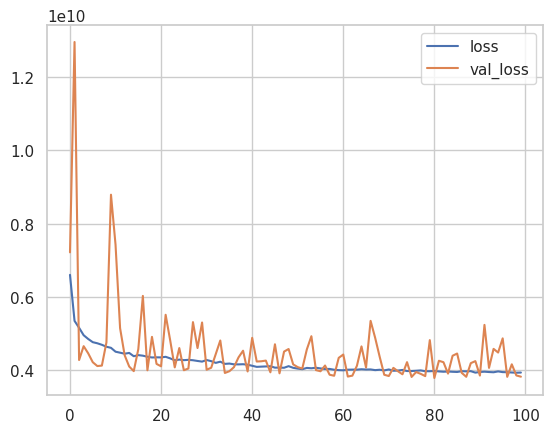

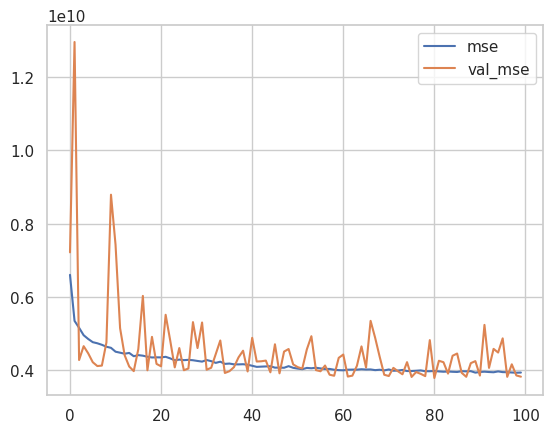

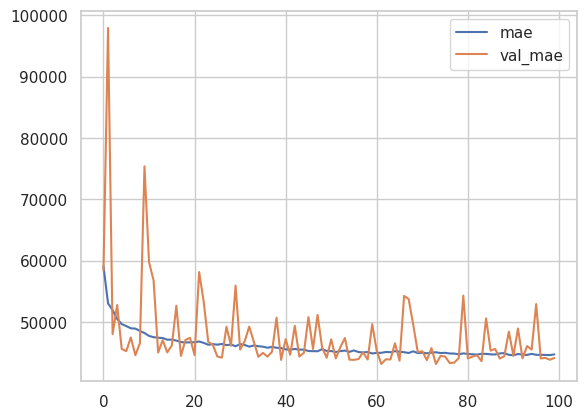

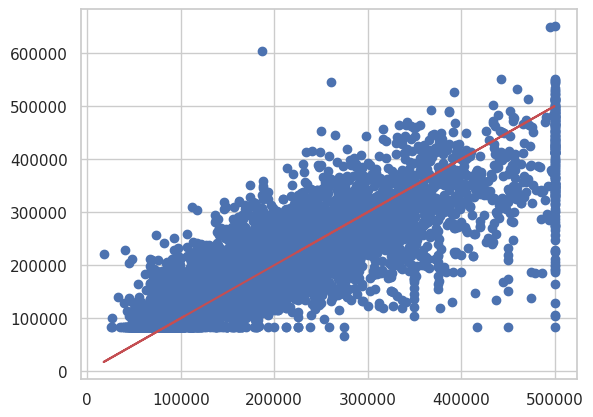

1/1 [==============================] - 0s 22ms/step


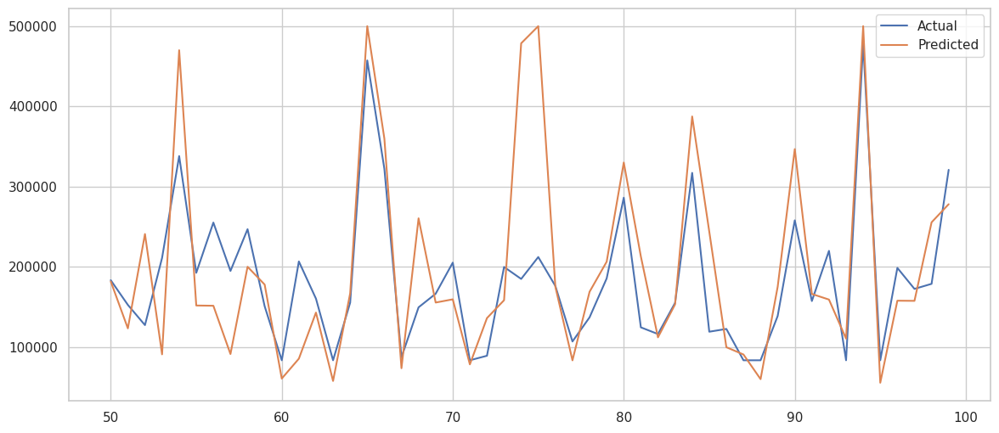

In [ ]:
tf.random.set_seed(1234)
model=Sequential([
    Dense(11,input_shape=[no_features_columns],activation='relu'),
    Dense(100,activation='relu') ,
    Dense(50,activation='relu') ,
    Dense(1)
])

model.compile(loss=["mse", "mae"], optimizer=keras.optimizers.RMSprop(learning_rate=0.1), metrics=["mse", "mae"])

model_history=model.fit(x=x_train,y=y_train,validation_data=(x_test,y_test),batch_size=32,epochs=100)

model.summary()

y_pred=model.predict(x_test)
R2 =r2_score(y_test, y_pred)
R2

losses=pd.DataFrame(model_history.history)

losses.head()

losses[['loss','val_loss']].plot()
plt.show()

losses[['mse','val_mse']].plot()
plt.show()

losses[['mae','val_mae']].plot()
plt.show()

mape=mean_absolute_percentage_error(y_test,y_pred)
mape

plt.scatter(y_test,y_pred)
plt.plot(y_test,y_test,'r')
plt.show()

model.evaluate(x_test,y_test,verbose=0)

model.evaluate(x_train,y_train,verbose=0)

single_house=data.drop('median_house_value',axis=1).iloc[10]
single_house=scaler_Robust.transform(single_house.values.reshape(-1,11))
single_house=scaler_MinMax.transform(single_house)
single_house=model.predict(single_house)
single_house


data['median_house_value'].iloc[10]

df1=pd.DataFrame(y_pred,columns=['y_pred'])
df2=pd.DataFrame(y_test,columns=['y_test'])

df=pd.concat([df1, df2], axis=1)
df.sample(10)

plt.figure(figsize=(14,6))
plt.plot(df[50:100])
plt.legend(["Actual" , "Predicted"])
plt.show()